In [1]:
# This notebook is for voxel-wise correlation of functional and structural gradients (multimodal - struct x func).

# Includes:
#     laoding gradient data
#     checking and saving resampled (to 1.6mm matching func) diffusion gradients
#     BF color coding by coordinate system
#     gradient correlations (struct x func)
#     joint fig of gradient correlation and distribution histogram
#     residuals calculation ie BF subregion most different in struct vs. func gradients

In [2]:
import os
from numpy import load
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm
import pandas as pd
import nibabel as nib
import matplotlib as mpl
import matplotlib.pyplot as plt
import pylab as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import linregress
from copy import copy
import pingouin as pg
from scipy.spatial.distance import cdist
from brainspace.null_models.variogram import SurrogateMaps

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


### Setting the path

In [3]:
main_path = "/srv/khan/users/sudesnac/00_Projects/"
#main_path = "/home/ROBARTS/schakraborty/graham/sudesnacPJ/21_Codes/"

In [4]:
# get the current notebook path
note_path = main_path + "/HumanBF-Parcellation/notebook/"
data_path = main_path + "/HumanBF-Parcellation/data/"
results_path = main_path + "/HumanBF-Parcellation/results/Grad_corr/"
fig_path = main_path + "/HumanBF-Parcellation/results/Grad_corr/figures/"

In [5]:
Func_results = main_path + "HumanBF-Parcellation/results/Func_HCPMMP/"
Diff_results = main_path + "HumanBF-Parcellation/results/Diff_7Tsubj/"
Fuse_results = main_path + "HumanBF-Parcellation/results/Fusion_grad/"

### Loading BF gradient data (nii files)

In [5]:
rfmri_fname = (Func_results + 'Func_HCPMMP_gradient_{0}.nii.gz')
dmri_fname = (Diff_results + 'Diff_7Tsubj_gradient_{0}.nii.gz')

In [6]:
rfmri_g1_nii  = nib.load(rfmri_fname.format(1))
dmri_g1_nii = nib.load(dmri_fname.format(1))

In [7]:
rfmri_g1 = rfmri_g1_nii.get_fdata()
rfmri_mask = np.where(rfmri_g1, 1, 0)

dmri_g1  = dmri_g1_nii.get_fdata()
dmri_mask = np.where(dmri_g1, 1, 0)

#### Creating combined mask and color-coded BF

In [9]:
combined_mask = np.zeros_like(dmri_mask)
combined_mask[(dmri_mask==1) & (rfmri_mask==1)] = 1

In [10]:
# Get X, Y, Z coordinates
ijk_indices = np.argwhere(combined_mask)
ijk_indices = np.hstack((ijk_indices,np.ones((len(ijk_indices),1))))

affine = rfmri_g1_nii.affine

xyz_coords = np.dot(ijk_indices, affine)

In [11]:
# Here we flip along the X axis to give left and right same color codes
new_ijk_indices = ijk_indices.copy()
new_ijk_indices[:,0] = np.abs((combined_mask.shape[0]/2)-ijk_indices[:,0])

In [12]:
# Create RGB array
min_max_scaler = preprocessing.MinMaxScaler()

c_com = np.zeros((len(new_ijk_indices),3))
c_com[:,0] = min_max_scaler.fit_transform(new_ijk_indices[:,0][:,np.newaxis])[:,0]
c_com[:,1] = min_max_scaler.fit_transform(new_ijk_indices[:,1][:,np.newaxis])[:,0]
c_com[:,2] = min_max_scaler.fit_transform(new_ijk_indices[:,2][:,np.newaxis])[:,0]

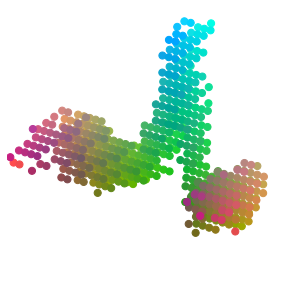

In [12]:
# combined functional x diffusion mask for func vs. diff correlation
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    c=c_com
)

plt.savefig(fig_path + f'BF_corr-color-ref_scatterplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Gradient Correlation structural vs functional - s6 x f4

#### Linear least-square regression

In [13]:
r2_matrix = np.zeros((6,4))
r_matrix = np.zeros((6,4))
p_matrix = np.zeros((6,4))
reg_results = pd.DataFrame()
dmri_rescaled = pd.DataFrame()
rfmri_rescaled = pd.DataFrame()

for g in range(6):
    dmri_g = nib.load(dmri_fname.format(g+1)).get_fdata()
    dmri_g_rescaled = min_max_scaler.fit_transform(dmri_g[combined_mask==1][:,np.newaxis])
    dmri_rescaled[g] = pd.DataFrame(dmri_g_rescaled)

    for gg in range(4):
        rfmri_g = nib.load(rfmri_fname.format(gg+1)).get_fdata()
        rfmri_g_rescaled = min_max_scaler.fit_transform(rfmri_g[combined_mask==1][:,np.newaxis])
        rfmri_rescaled[gg] = pd.DataFrame(rfmri_g_rescaled)
        
        res = linregress(dmri_g[combined_mask==1].flatten(), rfmri_g[combined_mask==1].flatten())
        
        reg_results[g,gg] = pd.DataFrame(res)
        r2_matrix[g,gg] = res.rvalue**2
        r_matrix[g,gg] = res.rvalue
        p_matrix[g,gg] = res.pvalue
        
index = pd.Index(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'])
reg_results = reg_results.set_index(index)       

In [15]:
pd.DataFrame(reg_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_results_s6-f4_scipy.csv', index=False)
pd.DataFrame(dmri_rescaled).to_csv(results_path + 'BF_Structural_gradients_rescaled-0to1.csv', index=False)
pd.DataFrame(rfmri_rescaled).to_csv(results_path + 'BF_Functional_gradients_rescaled-0to1.csv', index=False)

In [14]:
# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis

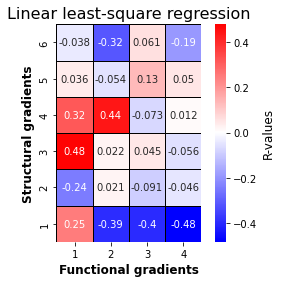

In [15]:
# plot r-values
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(r_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-values'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-values.png', dpi=300)
plt.show()

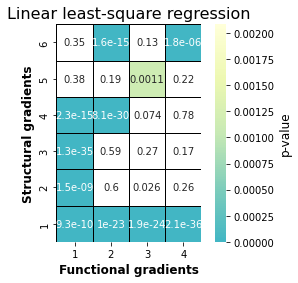

In [16]:
# plot significant p-values
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(p_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.invert_yaxis()
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_p-values.png', dpi=300)
plt.show()

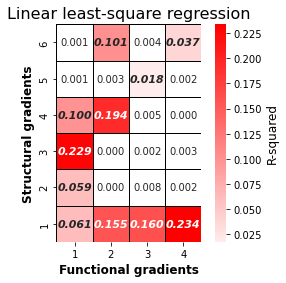

In [17]:
pval = 0.05/24

# plot r-squared
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(r2_matrix, mask=p_matrix < pval, cmap=ListedColormap(['white']), center=0, linewidth=1, linecolor='black', square=True,
           cbar=False,annot = True, fmt=".3f",
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax = sns.heatmap(r2_matrix, mask=p_matrix > pval, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
            cbar_kws={'label':'R-squared'}, annot = True, fmt=".3f", annot_kws={'fontsize':11,"weight": "bold", 'fontstyle':'italic'},
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_scipy-sigbold.png', dpi=300)
plt.show()

In [14]:
# average of R-squared over all 5x5 gradients
print(r2_matrix.mean())
print(r_matrix.mean())
print(r2_matrix.min())
print(r2_matrix.max())

0.057601173392632564
-0.022033369494188344
0.00013694880232730503
0.23364994492057692


#### Spearman correlation

In [22]:
from scipy import stats
spearmanr_matrix = np.zeros((6,4))
spearmanp_matrix = np.zeros((6,4))
spearmanr2_matrix = np.zeros((6,4))

for g in range(6):
    dmri_g = nib.load(dmri_fname.format(g+1)).get_fdata()
    dmri_g_rescaled = min_max_scaler.fit_transform(dmri_g[combined_mask==1][:,np.newaxis])    

    for gg in range(4):
        rfmri_g = nib.load(rfmri_fname.format(gg+1)).get_fdata()
        rfmri_g_rescaled = min_max_scaler.fit_transform(rfmri_g[combined_mask==1][:,np.newaxis])
        
        spearmanr, spearmanp = stats.spearmanr(dmri_g[combined_mask==1].flatten(), rfmri_g[combined_mask==1].flatten())
        
        spearmanr_matrix[g,gg] = spearmanr
        spearmanp_matrix[g,gg] = spearmanp
        spearmanr2_matrix[g,gg] = spearmanr**2

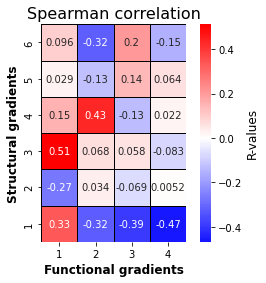

In [23]:
# plot pearson r-values
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(spearmanr_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-values'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation_s6-f4_R-values.png', dpi=300)
plt.show()

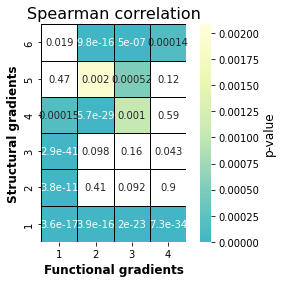

In [24]:
# plot pearson p-values
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(spearmanp_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation__s6-f4_p-values.png', dpi=300)
plt.show()

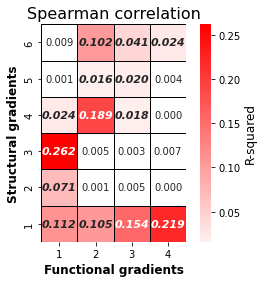

In [25]:
pval = 0.05/24

# plot r-squared
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(spearmanr2_matrix, mask=spearmanp_matrix < pval, cmap=ListedColormap(['white']), center=0, linewidth=1, linecolor='black', square=True,
           cbar=False,annot = True, fmt=".3f",
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax = sns.heatmap(spearmanr2_matrix, mask=spearmanp_matrix > pval, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
            cbar_kws={'label':'R-squared'}, annot = True, fmt=".3f", annot_kws={'fontsize':11,"weight": "bold", 'fontstyle':'italic'},
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation_s6-f4_R-squared_scipy-sigbold.png', dpi=300)
plt.show()

In [26]:
# average of R over all 5x5 gradients
print(spearmanr_matrix.mean())
# average of R-squared over all 5x5 gradients
print(spearmanr2_matrix.mean())

-0.007502561403900588
0.0579835787885479


### Structural vs Functional gradient correlations

#### Correlation SG1 vs. FG1 (specify G)

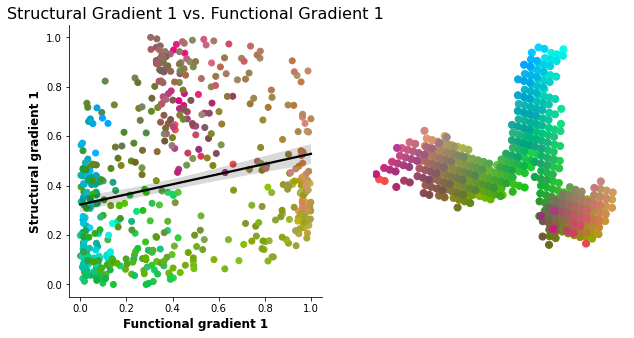

In [41]:
# Plot scatterplot colorcoded for XYZ coordinates
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(1,2,1)

ax1.scatter(rfmri_rescaled, dmri_rescaled, c=c_com)

ax1.set_xlabel('Functional gradient 1', weight='bold', fontsize=12)
ax1.set_ylabel('Structural gradient 1', weight='bold', fontsize=12)

plt.title("Structural Gradient 1 vs. Functional Gradient 1", fontsize=16)
# Add fit line
sns.regplot(
    x=rfmri_rescaled,
    y=dmri_rescaled,
    scatter=False, line_kws={'color': 'black'},
    ax=ax1)
sns.despine()

# Add 3D scatterplot for visualizing RGB values
ax2 = fig.add_subplot(1,2,2, projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    c=c_com
)

plt.show()

#### Structural vs Functional correlation for G1 to G6

In [19]:
# load the data
struct_rescaled = pd.read_csv(results_path + 'BF_Structural_gradients_rescaled-0to1.csv')
func_rescaled = pd.read_csv(results_path + 'BF_Functional_gradients_rescaled-0to1.csv')

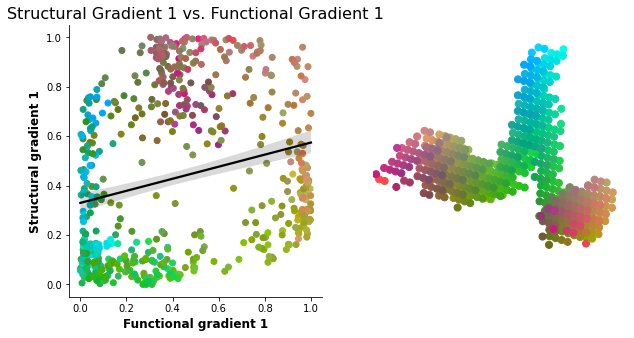

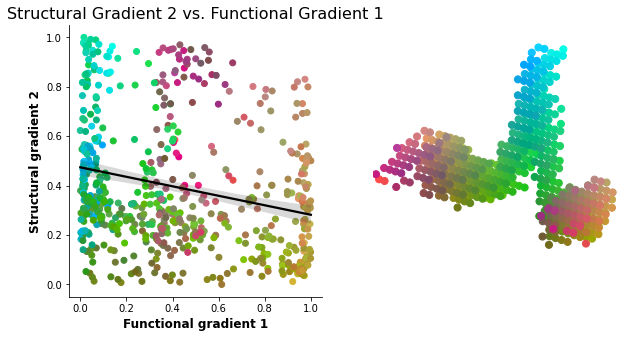

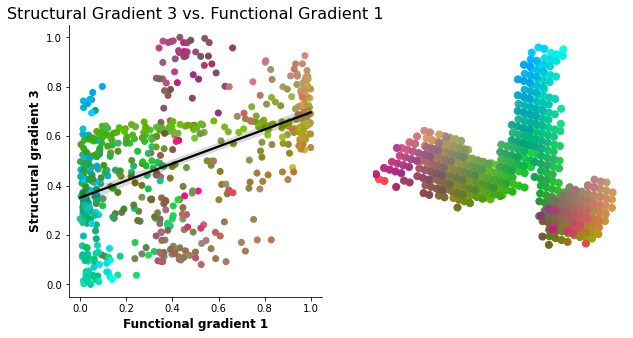

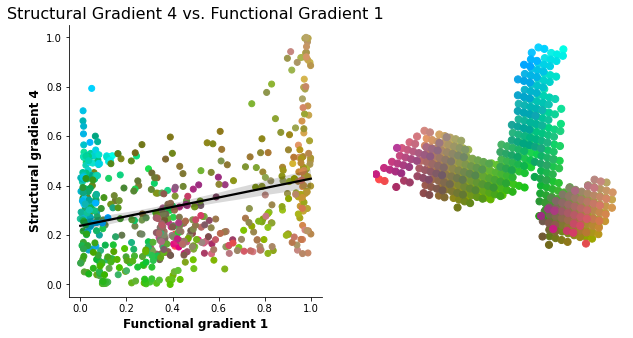

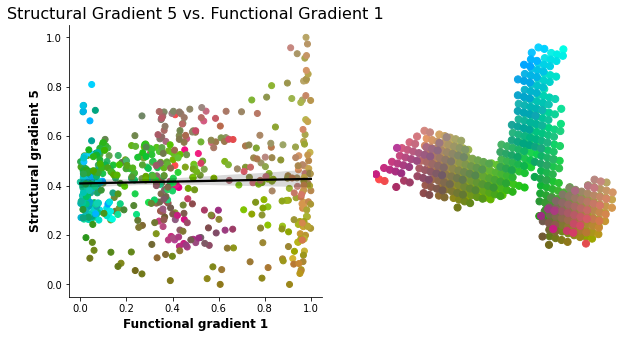

...

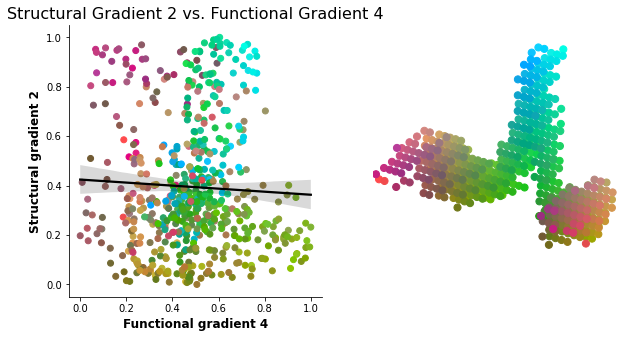

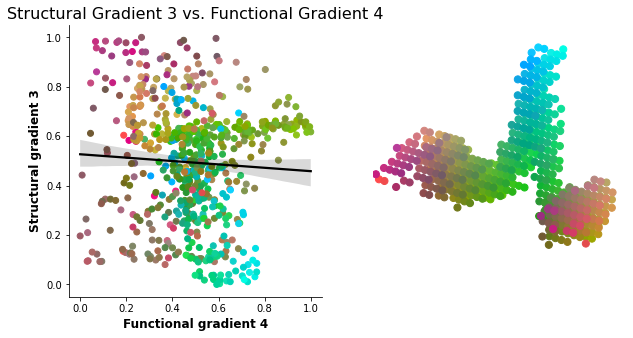

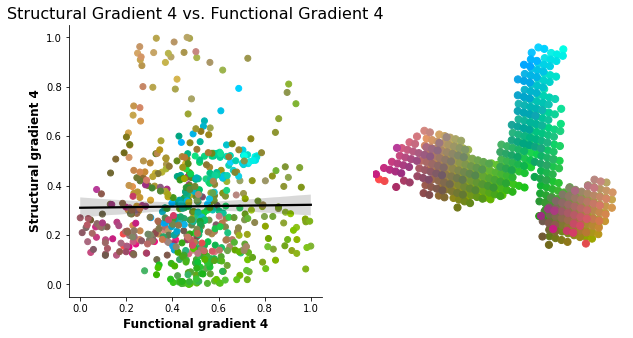

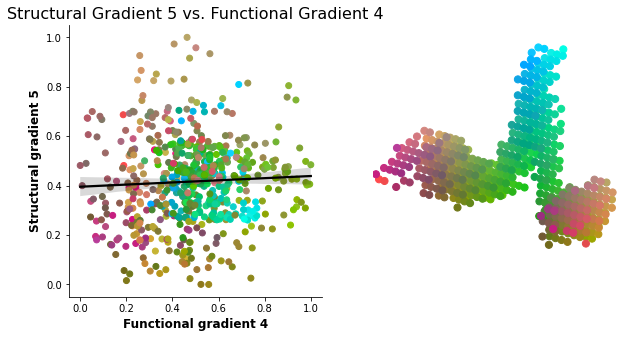

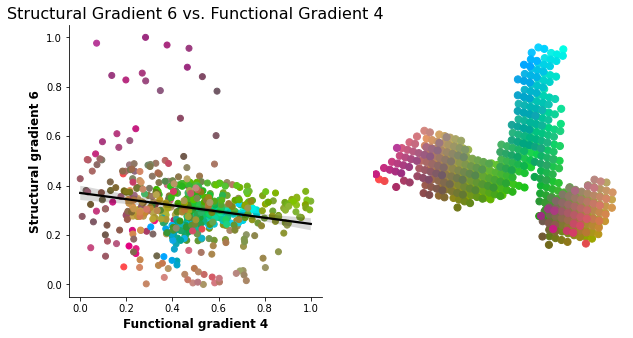

In [29]:
for fg in range(0,4):
    for dg in range(0,6):
        # Plot scatterplot colorcoded for XYZ coordinates
        fig = plt.figure(figsize=(10,5))
        ax1 = fig.add_subplot(1,2,1)
        
        x=func_rescaled[str(fg)].to_numpy()
        y=struct_rescaled[str(dg)].to_numpy()
        
        ax1.scatter(x,y,c=c_com)
        
        ax1.set_xlabel("Functional gradient "+str(fg+1), weight='bold', fontsize=12)
        ax1.set_ylabel("Structural gradient "+str(dg+1), weight='bold', fontsize=12)

        plt.title("Structural Gradient " + str(dg+1) + " vs. Functional Gradient " + str(fg+1), fontsize=16)
        
        # Add fit line
        sns.regplot(
            x=x,
            y=y,
            scatter=False, line_kws={'color': 'black'},
            ax=ax1)
        sns.despine()
                
        # Add 3D scatterplot for visualizing RGB values
        ax2 = fig.add_subplot(1,2,2, projection='3d')
        ax2.dist=6
        ax2.set_axis_off()
        ax2.scatter(ijk_indices[:,0],ijk_indices[:,1],ijk_indices[:,2],s=50, alpha=1,c=c_com)
        
        plt.savefig(fig_path + f'BF_Gradient_Struct_g-'+str(dg+1)+'_vs_Func_g-'+str(fg+1)+'_scaled-0to1.png', dpi=300)
        plt.show()

#### Structural vs Functional correlation and distribution

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/seaborn/axisgrid.py:1670: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


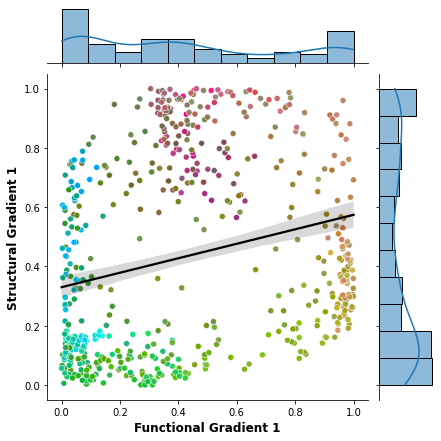

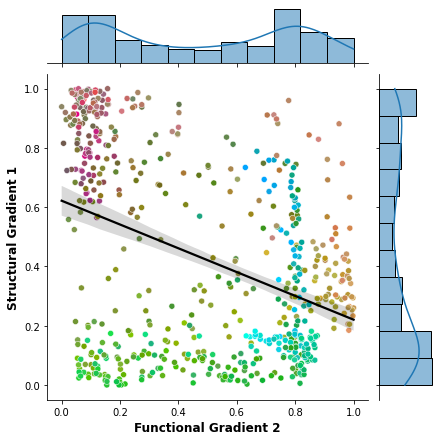

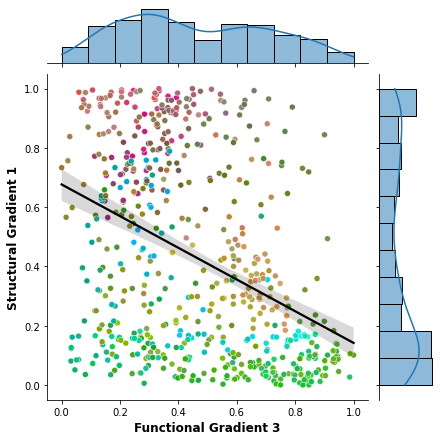

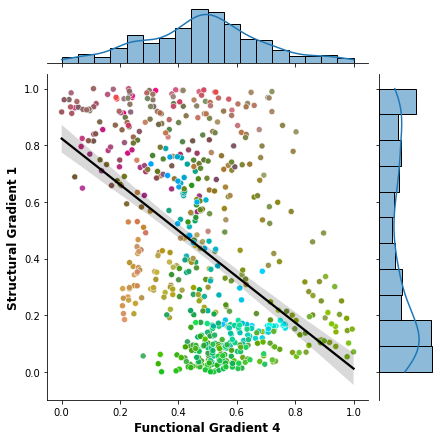

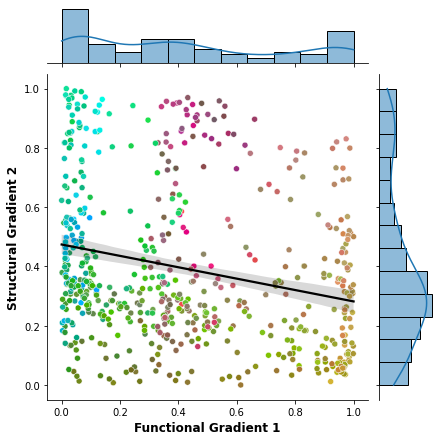

...

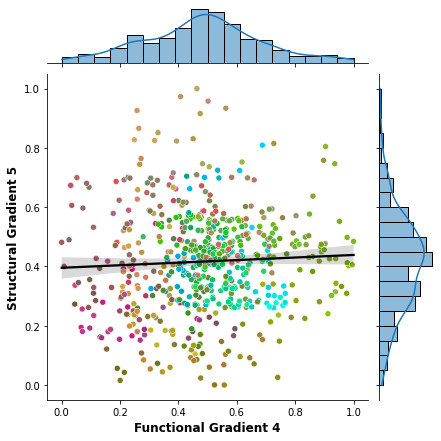

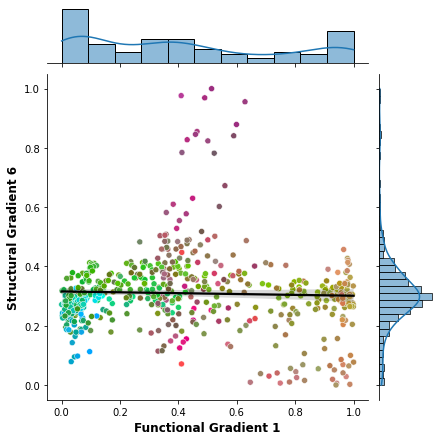

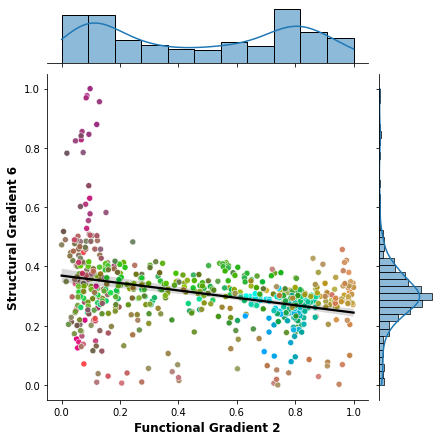

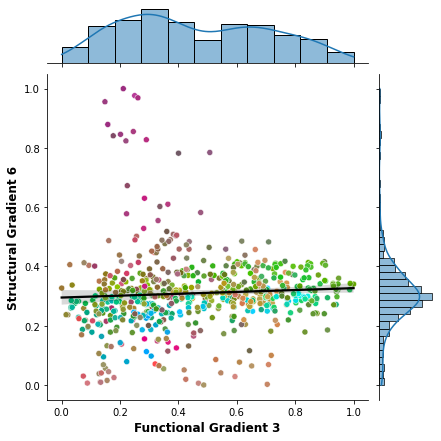

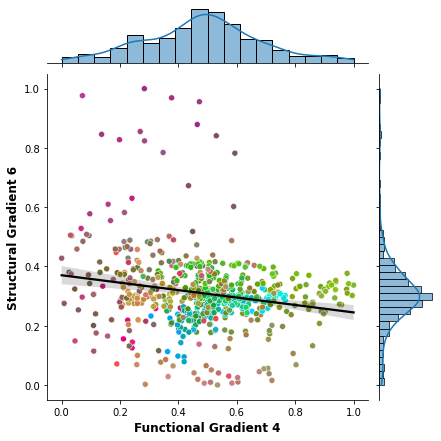

In [20]:
for dg in range(0,6): 
    for fg in range(0,4):
        
        x=func_rescaled[str(fg)].to_numpy()
        y=struct_rescaled[str(dg)].to_numpy()
        
        g = sns.JointGrid(x=x, y=y)
        g.plot_joint(sns.scatterplot, c=c_com)
        g.plot_marginals(sns.histplot, kde=True)
        g1 = sns.regplot(x=x, y=y, scatter=False, line_kws={'color': 'black'}, ax=g.ax_joint)
        g.set_axis_labels(xlabel=f'Functional Gradient '+str(fg+1), ylabel=f'Structural Gradient '+str(dg+1), weight='bold', fontsize=12)
        g.savefig(fig_path + f'BF_scaled_Gradients_correlation_and_distribution_Structural_g-'+ str(dg+1)+'_vs_Functional_g-'+ str(fg+1)+'.png', dpi=300)

### Calculating residuals for s6-f4 (variance based) combination

In [21]:
# load the data
rfmri_fname = (Func_results + 'Func_HCPMMP_gradient_{0}.nii.gz')
dmri_fname = (Diff_results + 'Diff_7Tsubj_gradient_{0}.nii.gz')

In [22]:
rsq_matrix = np.zeros((6,4))
pval_matrix = np.zeros((6,4))
resid_results = pd.DataFrame()

import statsmodels.api as sm
for dg in range(0,6):
    dmri_g = nib.load(dmri_fname.format(dg+1)).get_fdata()

    for fg in range(0,4):
        rfmri_g = nib.load(rfmri_fname.format(fg+1)).get_fdata()
        
        model = sm.OLS(rfmri_g[combined_mask==1].flatten(), dmri_g[combined_mask==1].flatten())
        results = model.fit()
        
        rsq_matrix[dg,fg] = results.rsquared
        pval_matrix[dg,fg] = results.pvalues
        resid_results[dg,fg] = pd.DataFrame(results.resid)

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [129]:
rsq_matrix

array([[6.08750441e-02, 1.55495083e-01, 1.60109596e-01, 2.33649856e-01],
       [5.94027088e-02, 4.53062371e-04, 8.29973986e-03, 2.10555250e-03],
       [2.29109890e-01, 4.77459563e-04, 2.02447885e-03, 3.12743362e-03],
       [9.99054452e-02, 1.93982002e-01, 5.31941110e-03, 1.36951129e-04],
       [1.30548472e-03, 2.93163750e-03, 1.76015092e-02, 2.49286456e-03],
       [1.43617473e-03, 1.00977375e-01, 3.77289090e-03, 3.74275468e-02]])

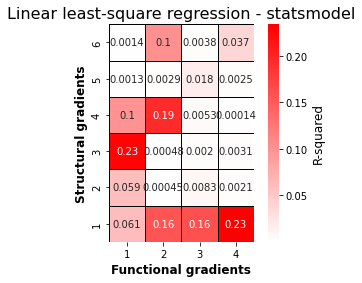

In [23]:
# plot r-squared to double check
fig, ax = plt.subplots(1,1, figsize=(5,4))
# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis
sns.heatmap(rsq_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-squared'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression - statsmodel', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_statsmodels.png', dpi=300)
plt.show()

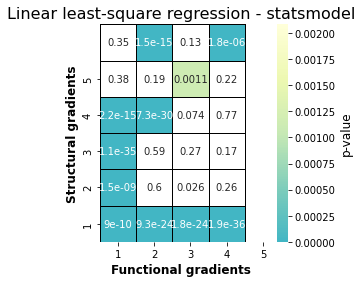

In [24]:
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4,5] # labels for x-axis
y_axis_labels = [1,2,3,4,5] # labels for y-axis

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(pval_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression - statsmodel', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_p-values_statsmodels.png', dpi=300)
plt.show()

In [35]:
pd.DataFrame(resid_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv', index=False)

### (unweighted) residuals 

In [25]:
resid_results = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv')

In [26]:
resid_results

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,-0.057653,-0.055553,0.001975,-0.016816,0.024720,-0.116090,-0.012252,-0.034254,-0.031991,-0.115583,...,-0.015312,-0.034813,-0.002606,-0.112736,-0.015119,-0.035477,-0.010807,-0.169982,-0.011050,-0.043502
1,-0.042537,-0.059177,0.004201,0.000010,0.018551,-0.121634,-0.012481,-0.019199,0.056339,-0.120440,...,-0.013806,-0.019032,0.013777,-0.117797,-0.014990,-0.020104,0.015474,-0.133543,-0.011926,-0.021056
2,-0.017267,-0.059772,-0.004495,0.011007,0.043890,-0.122275,-0.021186,-0.008215,0.076051,-0.121245,...,-0.022454,-0.008058,0.039540,-0.118876,-0.023413,-0.009019,0.040531,-0.135574,-0.020562,-0.010286
3,-0.057767,-0.055482,0.001809,-0.016923,-0.016341,-0.114295,-0.015249,-0.035831,0.102488,-0.112174,...,-0.015208,-0.035182,-0.008353,-0.107231,-0.019380,-0.037184,0.005734,-0.083269,-0.015843,-0.030444
4,-0.045108,-0.068165,-0.003121,-0.015820,0.022789,-0.122687,-0.016461,-0.031846,-0.018816,-0.122523,...,-0.018964,-0.032119,0.007340,-0.122480,-0.017038,-0.032178,0.000039,-0.157508,-0.015672,-0.037814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.250117,0.118244,0.012219,-0.031093,0.206290,0.134066,0.014068,-0.027671,0.171875,0.130442,...,0.017239,-0.026932,0.241604,0.127398,0.019214,-0.025594,0.235787,0.128462,0.016203,-0.027339
595,0.246290,0.130194,0.017884,-0.029380,0.232257,0.139180,0.019845,-0.026883,0.156189,0.136439,...,0.023763,-0.027252,0.231528,0.145081,0.016179,-0.028152,0.244222,0.173076,0.018460,-0.021471
596,0.232110,0.136999,0.017400,-0.025150,0.209124,0.134529,0.014611,-0.027203,0.169937,0.131055,...,0.019402,-0.026848,0.238699,0.130347,0.018055,-0.025762,0.232139,0.112234,0.017392,-0.029560
597,0.244702,0.140372,0.020918,-0.026297,0.256860,0.140327,0.021922,-0.025694,0.145182,0.138126,...,0.026485,-0.026909,0.230381,0.154332,0.012501,-0.029166,0.248484,0.165189,0.019867,-0.022392


In [27]:
# square 
resid_squared = resid_results**2
#resid_squared

In [28]:
pd.DataFrame(resid_squared).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv', index=False)

In [29]:
resid_squared = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [30]:
resid_squared

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.013477,0.000150,0.001173,0.001023,0.013359,...,0.000234,0.001212,0.000007,0.012709,0.000229,0.001259,1.167867e-04,0.028894,0.000122,0.001892
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.014795,0.000156,0.000369,0.003174,0.014506,...,0.000191,0.000362,0.000190,0.013876,0.000225,0.000404,2.394591e-04,0.017834,0.000142,0.000443
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.014951,0.000449,0.000067,0.005784,0.014700,...,0.000504,0.000065,0.001563,0.014131,0.000548,0.000081,1.642754e-03,0.018380,0.000423,0.000106
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.013063,0.000233,0.001284,0.010504,0.012583,...,0.000231,0.001238,0.000070,0.011499,0.000376,0.001383,3.287833e-05,0.006934,0.000251,0.000927
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.015052,0.000271,0.001014,0.000354,0.015012,...,0.000360,0.001032,0.000054,0.015001,0.000290,0.001035,1.498620e-09,0.024809,0.000246,0.001430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.017974,0.000198,0.000766,0.029541,0.017015,...,0.000297,0.000725,0.058372,0.016230,0.000369,0.000655,5.559553e-02,0.016502,0.000263,0.000747
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.019371,0.000394,0.000723,0.024395,0.018616,...,0.000565,0.000743,0.053605,0.021048,0.000262,0.000793,5.964461e-02,0.029955,0.000341,0.000461
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.018098,0.000213,0.000740,0.028879,0.017175,...,0.000376,0.000721,0.056977,0.016990,0.000326,0.000664,5.388840e-02,0.012596,0.000302,0.000874
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.019692,0.000481,0.000660,0.021078,0.019079,...,0.000701,0.000724,0.053076,0.023818,0.000156,0.000851,6.174410e-02,0.027288,0.000395,0.000501


In [31]:
# average 
resid_sqsum = resid_squared.sum(axis=1)
resid_sqsum_np = resid_sqsum.to_numpy()

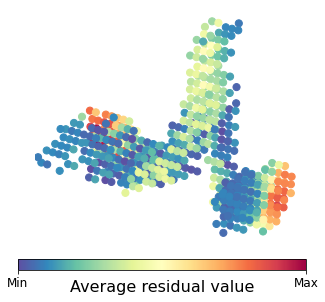

In [101]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_sqsum_np
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=resid_sqsum_np.min(), vmax=resid_sqsum_np.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[resid_sqsum_np.min(), resid_sqsum_np.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [33]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4',
               's2-f1','s2-f2','s2-f3','s2-f4',
               's3-f1','s3-f2','s3-f3','s3-f4',
               's4-f1','s4-f2','s4-f3','s4-f4',
               's5-f1','s5-f2','s5-f3','s5-f4',
               's6-f1','s6-f2','s6-f3','s6-f4']

In [34]:
np_resid_squared = resid_squared.to_numpy()

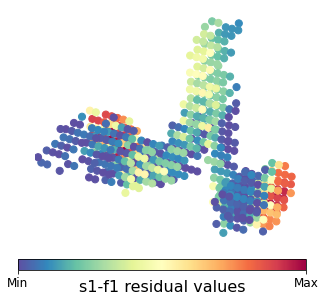

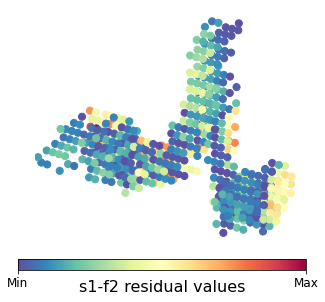

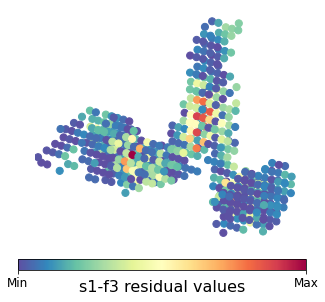

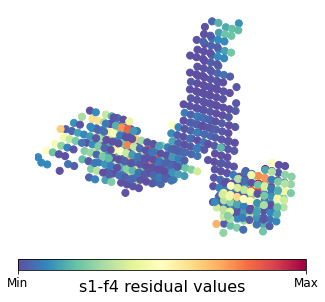

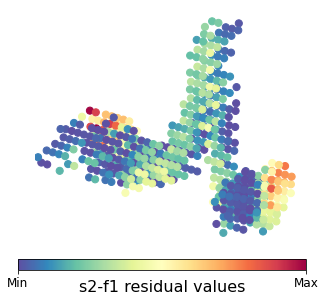

...

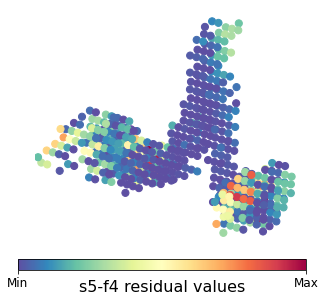

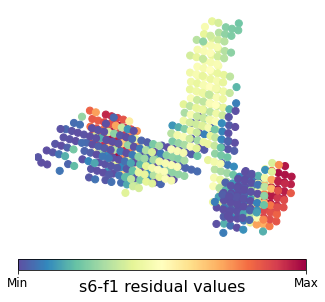

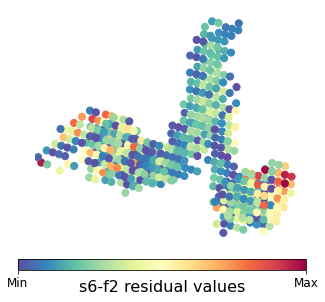

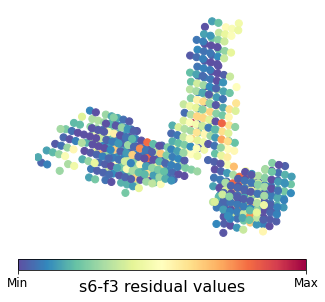

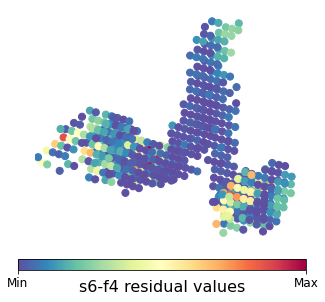

In [54]:
for res in range(24):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_squared[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_squared[:,res].min(), vmax=np_resid_squared[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_squared[:,res].min(), np_resid_squared[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

### weighted residuals 

In [35]:
Func_var = pd.read_csv(Func_results + 'Func_HCPMMP_gradients_variance_gm-100.csv')
Diff_var = pd.read_csv(Diff_results + 'Diff_7Tsubj_gradients_variance_gm-100.csv') 
resid_squared = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [36]:
func_var = Func_var.to_numpy()
diff_var = Diff_var.to_numpy()
np_resid_squared = resid_squared.to_numpy()

In [37]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4',
               's2-f1','s2-f2','s2-f3','s2-f4',
               's3-f1','s3-f2','s3-f3','s3-f4',
               's4-f1','s4-f2','s4-f3','s4-f4',
               's5-f1','s5-f2','s5-f3','s5-f4',
               's6-f1','s6-f2','s6-f3','s6-f4']

In [38]:
weight = np.zeros((6,4))
for s in range(6):
    for f in range(4):
        weight[s,f] = diff_var[s]+func_var[f]

In [39]:
weight = weight.reshape(24)
weighted_sqresid = pd.DataFrame(columns=combination)
for sf in range(24):
    ind = resid_squared.columns[sf]
    weighted_sqresid[combination[sf]] = resid_squared[ind]*weight[sf]

In [40]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.001985,0.001520,0.000001,9.862665e-05,0.000261,0.004347,0.000027,0.000210,0.000408,0.003935,...,0.000030,0.000155,0.000002,0.003067,0.000023,0.000123,3.931940e-05,0.006712,0.000011,1.673290e-04
1,0.001080,0.001725,0.000006,3.718602e-11,0.000147,0.004772,0.000028,0.000066,0.001266,0.004273,...,0.000025,0.000046,0.000066,0.003348,0.000022,0.000039,8.062042e-05,0.004143,0.000013,3.920216e-05
2,0.000178,0.001760,0.000007,4.225675e-05,0.000822,0.004823,0.000081,0.000012,0.002308,0.004330,...,0.000066,0.000008,0.000540,0.003410,0.000055,0.000008,5.530777e-04,0.004270,0.000038,9.355681e-06
3,0.001992,0.001517,0.000001,9.989260e-05,0.000114,0.004214,0.000042,0.000229,0.004191,0.003707,...,0.000030,0.000158,0.000024,0.002774,0.000038,0.000135,1.106938e-05,0.001611,0.000023,8.194774e-05
4,0.001215,0.002289,0.000003,8.729172e-05,0.000222,0.004855,0.000049,0.000181,0.000141,0.004422,...,0.000047,0.000132,0.000019,0.003620,0.000029,0.000101,5.045512e-10,0.005763,0.000022,1.264278e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.037351,0.006888,0.000052,3.372004e-04,0.018169,0.005798,0.000036,0.000137,0.011786,0.005012,...,0.000039,0.000093,0.020177,0.003916,0.000037,0.000064,1.871775e-02,0.003833,0.000024,6.608718e-05
595,0.036216,0.008351,0.000112,3.010717e-04,0.023031,0.006249,0.000071,0.000129,0.009733,0.005484,...,0.000073,0.000095,0.018529,0.005079,0.000026,0.000077,2.008098e-02,0.006958,0.000031,4.076092e-05
596,0.032166,0.009247,0.000106,2.206169e-04,0.018672,0.005838,0.000039,0.000132,0.011521,0.005060,...,0.000049,0.000092,0.019695,0.004099,0.000033,0.000065,1.814300e-02,0.002926,0.000028,7.726005e-05
597,0.035751,0.009708,0.000154,2.412036e-04,0.028169,0.006352,0.000087,0.000118,0.008409,0.005620,...,0.000091,0.000092,0.018346,0.005747,0.000016,0.000083,2.078783e-02,0.006339,0.000036,4.433386e-05


In [195]:
pd.DataFrame(weighted_sqresid).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv', index=False)

In [41]:
weighted_sqresid = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [42]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.001985,0.001520,0.000001,9.862665e-05,0.000261,0.004347,0.000027,0.000210,0.000408,0.003935,...,0.000030,0.000155,0.000002,0.003067,0.000023,0.000123,3.931940e-05,0.006712,0.000011,1.673290e-04
1,0.001080,0.001725,0.000006,3.718602e-11,0.000147,0.004772,0.000028,0.000066,0.001266,0.004273,...,0.000025,0.000046,0.000066,0.003348,0.000022,0.000039,8.062042e-05,0.004143,0.000013,3.920216e-05
2,0.000178,0.001760,0.000007,4.225675e-05,0.000822,0.004823,0.000081,0.000012,0.002308,0.004330,...,0.000066,0.000008,0.000540,0.003410,0.000055,0.000008,5.530777e-04,0.004270,0.000038,9.355681e-06
3,0.001992,0.001517,0.000001,9.989260e-05,0.000114,0.004214,0.000042,0.000229,0.004191,0.003707,...,0.000030,0.000158,0.000024,0.002774,0.000038,0.000135,1.106938e-05,0.001611,0.000023,8.194774e-05
4,0.001215,0.002289,0.000003,8.729172e-05,0.000222,0.004855,0.000049,0.000181,0.000141,0.004422,...,0.000047,0.000132,0.000019,0.003620,0.000029,0.000101,5.045512e-10,0.005763,0.000022,1.264278e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.037351,0.006888,0.000052,3.372004e-04,0.018169,0.005798,0.000036,0.000137,0.011786,0.005012,...,0.000039,0.000093,0.020177,0.003916,0.000037,0.000064,1.871775e-02,0.003833,0.000024,6.608718e-05
595,0.036216,0.008351,0.000112,3.010717e-04,0.023031,0.006249,0.000071,0.000129,0.009733,0.005484,...,0.000073,0.000095,0.018529,0.005079,0.000026,0.000077,2.008098e-02,0.006958,0.000031,4.076092e-05
596,0.032166,0.009247,0.000106,2.206169e-04,0.018672,0.005838,0.000039,0.000132,0.011521,0.005060,...,0.000049,0.000092,0.019695,0.004099,0.000033,0.000065,1.814300e-02,0.002926,0.000028,7.726005e-05
597,0.035751,0.009708,0.000154,2.412036e-04,0.028169,0.006352,0.000087,0.000118,0.008409,0.005620,...,0.000091,0.000092,0.018346,0.005747,0.000016,0.000083,2.078783e-02,0.006339,0.000036,4.433386e-05


In [43]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1).to_numpy()
weighted_sumsq.shape

(599,)

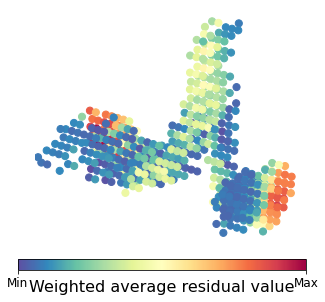

In [100]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=weighted_sumsq
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=weighted_sumsq.min(), vmax=weighted_sumsq.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[weighted_sumsq.min(), weighted_sumsq.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Weighted average residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_weighted-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [204]:
np_weighted_sqresid = weighted_sqresid.to_numpy()
np_weighted_sqresid.shape

(599, 24)

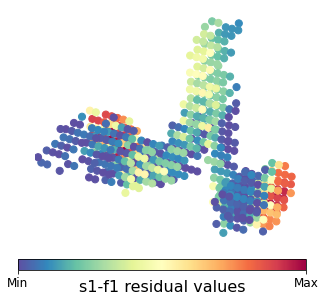

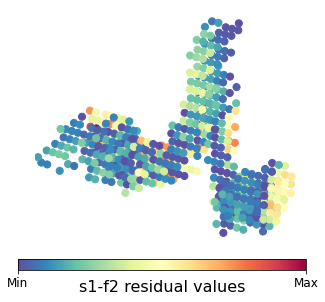

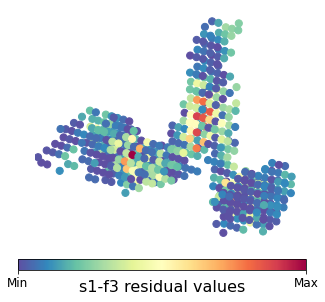

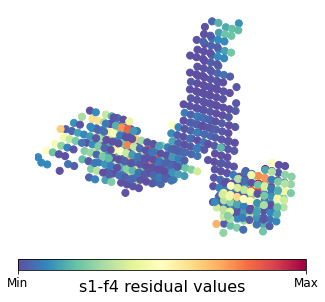

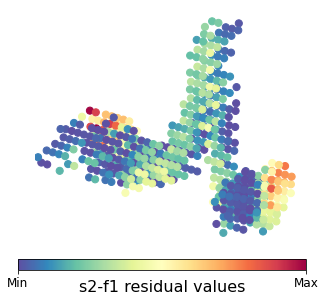

...

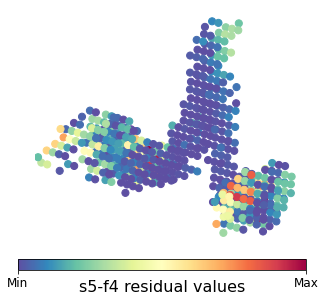

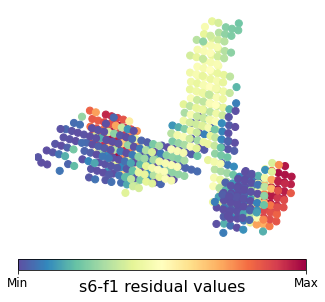

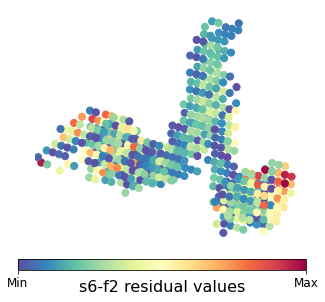

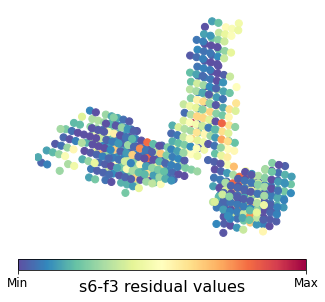

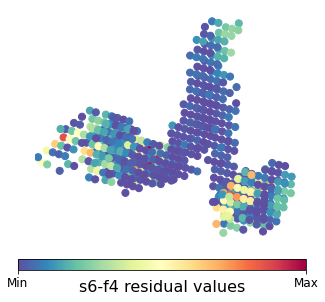

In [205]:
for res in range(24):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_weighted_sqresid[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_weighted_sqresid[:,res].min(), vmax=np_weighted_sqresid[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_weighted_sqresid[:,res].min(), np_weighted_sqresid[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_weighted-'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

### Residual in atlas subregions

#### loading BF atlas and visualize with 3D scatter plot for ref

In [149]:
fname = (data_path + 'BF_masked_fullB_1p6mm.dseg.nii.gz')

In [150]:
bf_nii = nib.load(fname).get_fdata()
bf_idx = np.argwhere(bf_nii)
bf_values = bf_nii[bf_idx[:,0], bf_idx[:,1], bf_idx[:,2]].flatten()

In [154]:
bf=nib.load(fname)

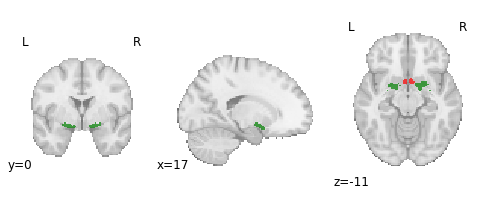

In [160]:
from nilearn import plotting
colors = ListedColormap(['red', 'green'])
plotting.plot_roi(bf, cmap=colors, draw_cross=False, display_mode='ortho')

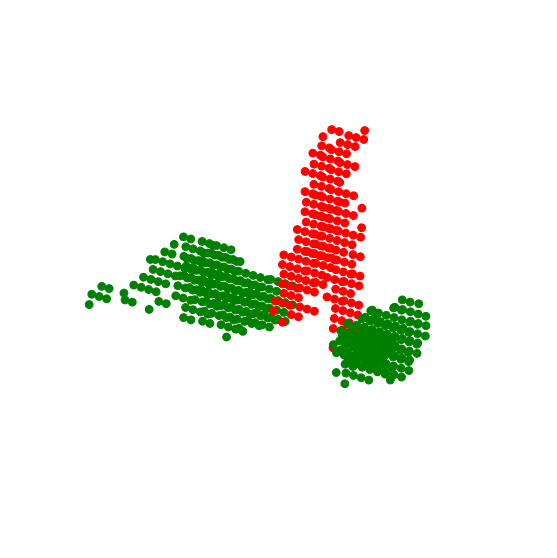

In [131]:
from matplotlib.colors import ListedColormap
colors = ListedColormap(['red', 'green'])

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
ax.dist=10
ax.set_axis_off()
    
ax.scatter(
    bf_idx[:,0],
    bf_idx[:,1],
    bf_idx[:,2],
    s=60, alpha=1,
    cmap=colors,
    c=bf_values
)

plt.savefig(fig_path+f'BF-atlas-2label_color-ref.png', dpi=300, bbox_inches='tight')
plt.show()

#### loading weighted residul data and plotting against BF atlas

In [132]:
weighted_sqresid = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [133]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1).to_numpy()
weighted_sumsq.shape

(599,)

In [134]:
combined_mask = np.zeros_like(dmri_mask)
combined_mask[(dmri_mask==1) & (rfmri_mask==1) & (bf_nii!=0)] = 1

In [135]:
bf_atlas_masked = bf_nii*combined_mask

In [136]:
np.count_nonzero(bf_atlas_masked)

599

In [137]:
bf_atlas_masked.shape

(113, 136, 113)

In [138]:
resid_wsig_sum_vol = np.zeros(combined_mask.shape)
resid_wsig_sum_vol[ijk_indices[:,0].astype(int),ijk_indices[:,1].astype(int),ijk_indices[:,2].astype(int)] = weighted_sumsq

In [139]:
df = pd.DataFrame(
    dict(
        resid=resid_wsig_sum_vol[bf_atlas_masked!=0].flatten(),
        labels=bf_atlas_masked[bf_atlas_masked!=0].flatten(),
        funcG1=rfmri_g1[bf_atlas_masked!=0].flatten(),
        diffG1=dmri_g1[bf_atlas_masked!=0].flatten()
    )
)

In [140]:
pd.DataFrame(df).to_csv(results_path + 'BF_atlas-2label_weighted-resid_FG1_SG1.csv', index=False)

In [141]:
df = pd.read_csv(results_path + 'BF_atlas-2label_weighted-resid_FG1_SG1.csv')

In [142]:
labels = ['Ch123', 'Ch44p']

##### boxplot

In [64]:
resid_Ch123 = resid_wsig_sum_vol[bf_atlas_masked == 1]
resid_Ch4 = resid_wsig_sum_vol[bf_atlas_masked == 2]
resid_Ch4p = resid_wsig_sum_vol[bf_atlas_masked == 3]
resid = [resid_Ch123, resid_Ch4, resid_Ch4p]

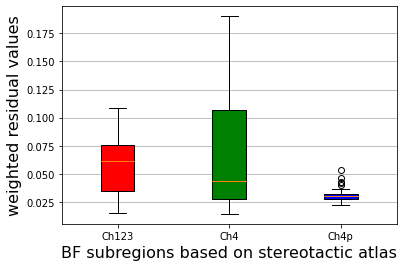

In [67]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))

# rectangular box plot
bplot = ax.boxplot(resid,
                     vert=True,  # vertical box alignment
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
#ax.set_title('weighted residual', fontsize=16)

# fill with colors
colors = ['red', 'green', 'blue']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

# adding horizontal grid lines
ax.yaxis.grid(True)
ax.set_xlabel('BF subregions based on stereotactic atlas', fontsize=16)
ax.set_ylabel('weighted residual values', fontsize=16)

plt.savefig(fig_path+f'BF-atlas_weighted-resid_boxplot.png', dpi=300, bbox_inches='tight')
plt.show()

#### strip plot (& extra scatter plots)

<function matplotlib.pyplot.show(close=None, block=None)>

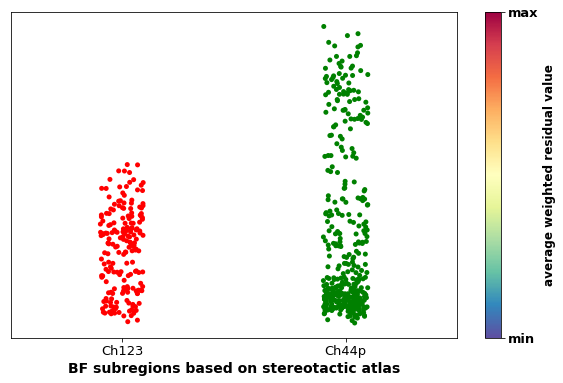

In [143]:
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.stripplot(data=df, x="labels", y="resid", palette=['red', 'green'])
ax.set_xticklabels(labels)
plt.xlabel('BF subregions based on stereotactic atlas', size=14, weight=900)
plt.ylabel("")
#plt.title('average weighted residual values', size=14, weight=900)
plt.xticks(size=13)
plt.yticks([])

cmap = plt.get_cmap("Spectral_r")
norm = plt.Normalize(df['resid'].min(), df['resid'].max())
sm =  ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, ticks=[df['resid'].min(), df['resid'].max()])
cbar.ax.set_yticklabels(['min','max'], fontsize=13, weight=600)
cbar.ax.set_ylabel("average weighted residual value", fontsize=12, weight=600)
#cbar.ax.set_title("G1", fontsize=12, weight=900)

plt.savefig(fig_path+f'BF-atlas-2label_weighted-resid__stripplot.png', dpi=300, bbox_inches='tight')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

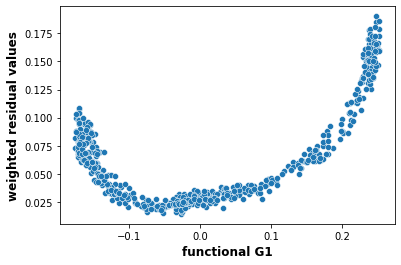

In [72]:
#labels = ['Ch123', 'Ch4', 'Ch4p']
fig, ax = plt.subplots(figsize=(6, 4))
ax = sns.scatterplot(data=df, x="funcG1", y="resid", palette="Spectral_r")
#ax.set_xticklabels(labels)
plt.xlabel('functional G1', size=12, weight=900)
plt.ylabel('weighted residual values', size=12, weight=900)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

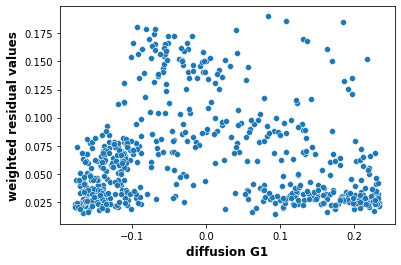

In [74]:
#labels = ['Ch123', 'Ch4', 'Ch4p']
fig, ax = plt.subplots(figsize=(6, 4))
ax = sns.scatterplot(data=df, x="diffG1", y="resid", palette="Spectral_r")
#ax.set_xticklabels(labels)
plt.xlabel('diffusion G1', size=12, weight=900)
plt.ylabel('weighted residual values', size=12, weight=900)
plt.show

#### stats

In [91]:
df

,resid,labels,funcG1,diffG1
0,0.025630,3.0,-0.000632,0.219320
1,0.024526,3.0,0.017674,0.231589
2,0.027861,3.0,0.042986,0.231753
3,0.023781,3.0,-0.000140,0.221652
4,0.026358,3.0,0.006611,0.198926
...,...,...,...,...
594,0.151444,2.0,0.236503,-0.052365
595,0.149958,2.0,0.237930,-0.032154
596,0.138827,2.0,0.235959,0.014806
597,0.150802,2.0,0.244045,-0.002528


In [95]:
import pingouin as pg
aov = pg.welch_anova(dv='resid', between='labels', data=df)

In [97]:
pg.print_table(aov, floatfmt='.6f')


ANOVA SUMMARY

Source      ddof1       ddof2           F     p-unc       np2
--------  -------  ----------  ----------  --------  --------
labels          2  305.891211  142.287253  0.000000  0.047608



In [98]:
posthoc = pg.pairwise_gameshowell(dv='resid', between='labels', data=df)

In [99]:
pg.print_table(posthoc, floatfmt='.6f')


POST HOC TESTS

       A         B    mean(A)    mean(B)       diff        se          T          df      pval     hedges
--------  --------  ---------  ---------  ---------  --------  ---------  ----------  --------  ---------
1.000000  2.000000   0.057735   0.068581  -0.010846  0.003150  -3.442584  555.223259  0.001791  -0.304890
1.000000  3.000000   0.057735   0.031303   0.026432  0.002020  13.084843  202.619862  0.000000   2.366725
2.000000  3.000000   0.068581   0.031303   0.037278  0.002853  13.066971  388.662918  0.000000   2.277343



#### residual variability stats

In [6]:
# Load seed mask
mask = nib.load(data_path+'seed_1p6mm.nii.gz')
mask = mask.get_fdata()
ind  = np.argwhere(mask)

In [7]:
# load the data
df = pd.read_csv(results_path + 'BF_atlas-2label_weighted-resid_FG1_SG1.csv')

In [8]:
df.head(5)

,resid,labels,funcG1,diffG1
0,0.025630,2.0,-0.000632,0.219320
1,0.024526,2.0,0.017674,0.231589
2,0.027861,2.0,0.042986,0.231753
3,0.023781,2.0,-0.000140,0.221652
4,0.026358,2.0,0.006611,0.198926


In [9]:
atlas = df['labels'].values
resid_mean = df['resid'].values

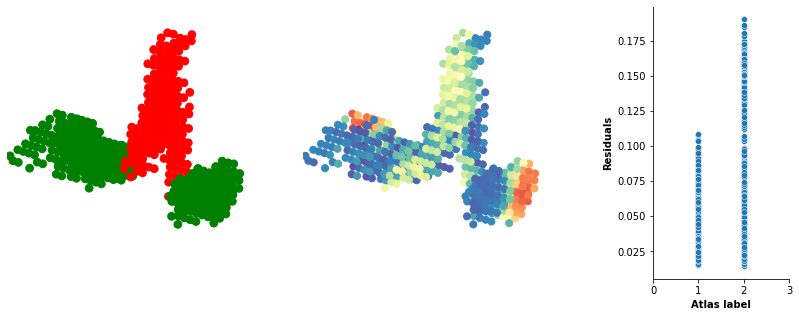

In [10]:
# Plot data
colors = ListedColormap(['red', 'green'])

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(131, projection='3d')
ax.dist=6
ax.set_axis_off()
    
ax.scatter(
    ind[:,0],
    ind[:,1],
    ind[:,2],
    s=60, alpha=1,
    cmap=colors,
    c=atlas
)

ax1 = fig.add_subplot(132, projection='3d')
ax1.dist=6
ax1.set_axis_off()

ax1.scatter(
    ind[:,0],
    ind[:,1],
    ind[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_mean
)

ax2 = fig.add_subplot(133, box_aspect=2)
sns.scatterplot(x=atlas, y=resid_mean, ax=ax2)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.set_ylabel('Residuals', weight='bold')
ax2.set_xlabel('Atlas label', weight='bold')
ax2.set_xlim((0,3))

plt.show()

In [11]:
# Calculate variability for empirical data
x1 = resid_mean[atlas==1]
x2 = resid_mean[atlas==2]

# Standard deviation
std1 = np.std(x1)
std2 = np.std(x2)
emp_std_diff = std1-std2

# Variance
var1 = np.var(x1)
var2 = np.var(x2)
emp_var_diff = var1-var2

# Coefficient of variation
cov = lambda x: np.std(x, ddof=1) / np.mean(x) * 100
cov1 = cov(x1)
cov2 = cov(x2)
emp_cov_diff = cov1-cov2

In [12]:
print(emp_var_diff)
print(emp_cov_diff)

-0.0018941318521253478
-34.77140749577792


In [13]:
# Calculate distance matrix for BASF voxels
dist = cdist(ind, ind)

In [14]:
# Use distance matrix to fit the SurrogateMaps function
vg = SurrogateMaps(resample=True, random_state=1234).fit(dist)

In [15]:
# Calculate empirical variogram
emp_var = vg.compute_variogram(np.array(resid_mean))
emp_var, u0 = vg.smooth_variogram(emp_var, return_h=True)

In [16]:
# Then use the fitted SurrogateMaps function to generate surrogate map
nsurr = 1000
surr = vg.randomize(np.array(resid_mean), n_rep=nsurr)

In [17]:
# Compute surrogate map variograms
surr_var = np.empty((nsurr, len(emp_var)))
for i in range(nsurr):
    tmp = vg.compute_variogram(np.array(surr[i,:]))
    surr_var[i] = vg.smooth_variogram(tmp)

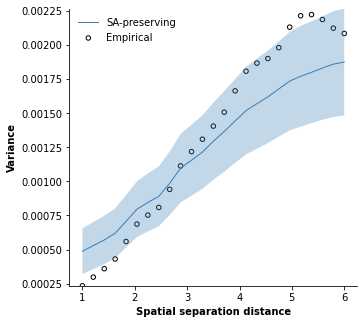

In [18]:
# # Create plot for inspecting fit of surrogate models
# Plot empirical variogram
fig = plt.figure(figsize=(5, 5))
ax = fig.add_axes([0.12, 0.15, 0.8, 0.77])
ax.autoscale(axis='y', tight=True)

ax.scatter(u0, emp_var, s=20, facecolor='none', edgecolor='k',
           marker='o', lw=1, label='Empirical')

# Plot surrogate maps' variograms
mu = surr_var.mean(axis=0)
sigma = surr_var.std(axis=0)
ax.fill_between(u0, mu-sigma, mu+sigma, facecolor='#377eb8',
                edgecolor='none', alpha=0.3)
ax.plot(u0, mu, color='#377eb8', label='SA-preserving', lw=1)

# Make plot nice
leg = ax.legend(loc=0)
leg.get_frame().set_linewidth(0.0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("Spatial separation distance", weight='bold')
ax.set_ylabel("Variance", weight='bold')

plt.show()


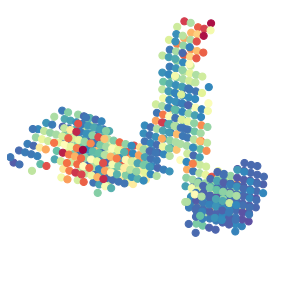

In [19]:
# PLot surrogate map example
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')
ax.dist=6
ax.set_axis_off()

ax.scatter(
    ind[:,0],
    ind[:,1],
    ind[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=surr[0,:]
)

In [20]:
# Calculate surrogate variability
surr_std_diff = np.empty((nsurr, 1))
surr_var_diff = np.empty((nsurr, 1))
surr_cov_diff = np.empty((nsurr, 1))

for i in range(nsurr):
    x1 = surr[i,atlas==1]
    x2 = surr[i,atlas==2]
    
    # Standard deviation
    std1 = np.std(x1)
    std2 = np.std(x2)
    surr_std_diff[i] = std1-std2
    
    # Variance
    var1 = np.var(x1)
    var2 = np.var(x2)
    surr_var_diff[i] = var1-var2
    
    # Coefficient of variation
    cov = lambda x: np.std(x, ddof=1) / np.mean(x) * 100
    cov1 = cov(x1)
    cov2 = cov(x2)
    surr_cov_diff[i] = cov1-cov2


Pvalue = 0.02400000000000002


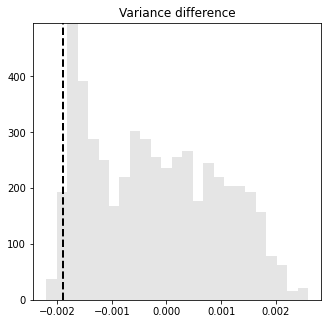

In [21]:
# Plot 
fig = plt.figure(figsize=(5, 5))
ax = fig.add_axes([0.12, 0.15, 0.8, 0.77])
ax.autoscale(axis='y', tight=True)

ax.hist(surr_var_diff, bins=25, density=True, alpha=0.5, color=(.8, .8, .8))
ax.axvline(emp_var_diff, lw=2, ls='--', color='k')
ax.set_title('Variance difference')

pvalue = 1-(np.sum(surr_var_diff>emp_var_diff)/nsurr)
print(f'Pvalue = {pvalue}')

Pvalue = 0.013000000000000012


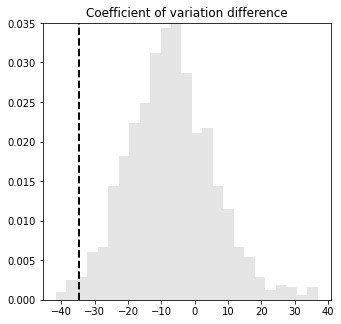

In [22]:
# Plot 
fig = plt.figure(figsize=(5, 5))
ax = fig.add_axes([0.12, 0.15, 0.8, 0.77])
ax.autoscale(axis='y', tight=True)

ax.hist(surr_cov_diff, bins=25, density=True, alpha=0.5, color=(.8, .8, .8))
ax.axvline(emp_cov_diff, lw=2, ls='--', color='k')
ax.set_title('Coefficient of variation difference')

pvalue = 1-(np.sum(surr_cov_diff>emp_cov_diff)/nsurr)
print(f'Pvalue = {pvalue}')

Pvalue = 0.08699999999999997


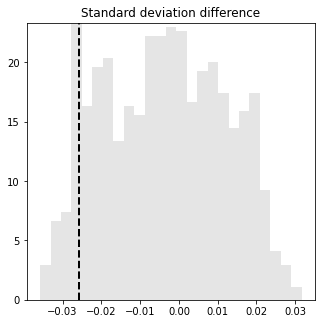

In [23]:
# Plot 
fig = plt.figure(figsize=(5, 5))
ax = fig.add_axes([0.12, 0.15, 0.8, 0.77])
ax.autoscale(axis='y', tight=True)

ax.hist(surr_std_diff, bins=25, density=True, alpha=0.5, color=(.8, .8, .8))
ax.axvline(emp_std_diff, lw=2, ls='--', color='k')
ax.set_title('Standard deviation difference')

pvalue = 1-(np.sum(surr_std_diff>emp_std_diff)/nsurr)
print(f'Pvalue = {pvalue}')

### Gradient-weighted cortical map residuals

#### loading data

In [19]:
Func_GCtx = np.load(Func_results + 'Func_HCPMMP_Gradient-weighted_CorticalConnectivity.npz')
Func_GCtx.files

['G1_Ctx', 'G2_Ctx', 'G3_Ctx', 'G4_Ctx']

In [20]:
func_g1 = Func_GCtx['G1_Ctx']
func_g2 = Func_GCtx['G2_Ctx']
func_g3 = Func_GCtx['G3_Ctx']
func_g4 = Func_GCtx['G4_Ctx']

In [27]:
func_g1_ctx = np.nanmean(func_g1,axis=0)
func_g2_ctx = np.nanmean(func_g2,axis=0)
func_g3_ctx = np.nanmean(func_g3,axis=0)
func_g4_ctx = np.nanmean(func_g4,axis=0)
func_gctx = [func_g1_ctx, func_g2_ctx, func_g3_ctx, func_g4_ctx]

In [30]:
func_gctx[0].shape

(360,)

In [23]:
Diff_GCtx = np.load(Diff_results + 'Diff_7Tsubj_Gradient-weighted_CorticalConnectivity.npz')
Diff_GCtx.files

['G1_Ctx', 'G2_Ctx', 'G3_Ctx', 'G4_Ctx', 'G5_Ctx', 'G6_Ctx']

In [24]:
diff_g1 = Diff_GCtx['G1_Ctx']
diff_g2 = Diff_GCtx['G2_Ctx']
diff_g3 = Diff_GCtx['G3_Ctx']
diff_g4 = Diff_GCtx['G4_Ctx']
diff_g5 = Diff_GCtx['G5_Ctx']
diff_g6 = Diff_GCtx['G6_Ctx']

In [26]:
diff_g1_ctx = np.nanmean(diff_g1,axis=0)
diff_g2_ctx = np.nanmean(diff_g2,axis=0)
diff_g3_ctx = np.nanmean(diff_g3,axis=0)
diff_g4_ctx = np.nanmean(diff_g4,axis=0)
diff_g5_ctx = np.nanmean(diff_g5,axis=0)
diff_g6_ctx = np.nanmean(diff_g6,axis=0)
diff_gctx = [diff_g1_ctx, diff_g2_ctx, diff_g3_ctx, diff_g4_ctx, diff_g5_ctx, diff_g6_ctx]

#### calculate residuals

In [31]:
rsq_matrix = np.zeros((6,4))
pval_matrix = np.zeros((6,4))
resid_results = pd.DataFrame()

import statsmodels.api as sm
for dg in range(0,6):
    dmri_g = diff_gctx[dg]

    for fg in range(0,4):
        rfmri_g = func_gctx[fg]
        
        model = sm.OLS(func_gctx[fg], diff_gctx[dg])
        results = model.fit()
        
        rsq_matrix[dg,fg] = results.rsquared
        pval_matrix[dg,fg] = results.pvalues
        resid_results[dg,fg] = pd.DataFrame(results.resid)

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


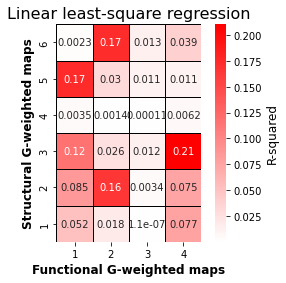

In [41]:
# plot r-squared to double check
fig, ax = plt.subplots(1,1, figsize=(5,4))
# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis
sns.heatmap(rsq_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-squared'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural G-weighted maps', weight='bold', fontsize=12)
ax.set_xlabel('Functional G-weighted maps', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_statsmodels.png', dpi=300)
plt.show()

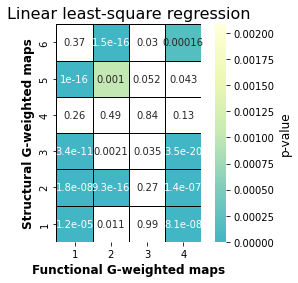

In [42]:
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(pval_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural G-weighted maps', weight='bold', fontsize=12)
ax.set_xlabel('Functional G-weighted maps', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_p-values_statsmodels.png', dpi=300)
plt.show()

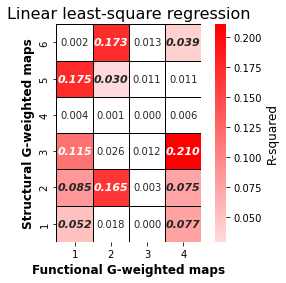

In [43]:
pval = 0.05/24

# plot r-squared
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(rsq_matrix, mask=pval_matrix < pval, cmap=ListedColormap(['white']), center=0, linewidth=1, linecolor='black', square=True,
           cbar=False,annot = True, fmt=".3f",
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax = sns.heatmap(rsq_matrix, mask=pval_matrix > pval, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
            cbar_kws={'label':'R-squared'}, annot = True, fmt=".3f", annot_kws={'fontsize':11,"weight": "bold", 'fontstyle':'italic'},
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural G-weighted maps', weight='bold', fontsize=12)
ax.set_xlabel('Functional G-weighted maps', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_scipy-sigbold.png', dpi=300)
plt.show()

In [44]:
print(rsq_matrix.mean())
print(rsq_matrix.mean())
print(rsq_matrix.min())
print(rsq_matrix.max())

0.054302970422922446
0.054302970422922446
1.1293411994461877e-07
0.21037710634951878


In [46]:
pd.DataFrame(resid_results).to_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv', index=False)

#### (unweighted) residual

In [47]:
resid_results = pd.read_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv')

In [48]:
resid_results

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,0.007964,-0.001545,0.000140,0.000324,0.007612,-0.001173,0.000165,0.000302,0.010529,-0.001702,...,0.000145,0.000153,0.008858,-0.001651,0.000117,0.000215,0.010909,-0.000574,0.000235,0.000040
1,0.005750,0.000135,-0.000125,-0.000175,0.006882,0.000134,-0.000121,-0.000213,0.006099,0.000099,...,-0.000123,-0.000245,0.004692,0.000143,-0.000144,-0.000213,0.007357,0.000300,-0.000104,-0.000266
2,0.005041,0.000151,0.000045,0.000138,0.008130,0.000106,0.000053,0.000036,0.006309,0.000047,...,0.000049,-0.000030,0.003788,0.000121,0.000007,0.000035,0.009145,0.000399,0.000085,-0.000065
3,0.003753,-0.000622,-0.000008,0.000167,0.004328,-0.000392,0.000011,0.000126,0.007030,-0.000806,...,-0.000003,0.000009,0.003462,-0.000677,-0.000036,0.000073,0.006507,0.000247,0.000078,-0.000092
4,0.003207,-0.000754,-0.000001,0.000113,0.003780,-0.000479,0.000020,0.000068,0.005526,-0.000903,...,0.000004,-0.000065,0.003073,-0.000826,-0.000033,0.000004,0.006785,-0.000076,0.000072,-0.000144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,-0.021441,0.000473,-0.000678,0.000170,-0.019958,0.000507,-0.000670,0.000116,-0.019825,0.000372,...,-0.000676,0.000064,-0.021484,0.000426,-0.000698,0.000100,-0.019129,0.000879,-0.000634,0.000009
356,-0.007552,-0.001757,-0.000026,0.000149,-0.007380,-0.001632,-0.000017,0.000131,-0.006449,-0.001825,...,-0.000025,0.000078,-0.007577,-0.001788,-0.000039,0.000102,-0.006025,-0.001490,0.000003,0.000043
357,0.016487,-0.001050,0.000351,0.000051,0.015492,-0.000703,0.000372,0.000054,0.017287,-0.001115,...,0.000354,-0.000056,0.009307,-0.000830,0.000286,0.000025,0.018865,-0.000710,0.000390,-0.000100
358,0.019167,-0.002087,0.000702,0.000509,0.020456,-0.002458,0.000681,0.000499,0.021512,-0.002159,...,0.000700,0.000609,0.014824,-0.001879,0.000693,0.000602,0.016010,-0.001681,0.000722,0.000561


In [49]:
# square 
resid_squared = resid_results**2
#resid_squared

In [50]:
pd.DataFrame(resid_squared).to_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv', index=False)

In [51]:
resid_squared = pd.read_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [52]:
resid_squared

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,0.000063,2.387773e-06,1.955629e-08,1.051478e-07,0.000058,1.377060e-06,2.718085e-08,9.128558e-08,0.000111,2.897078e-06,...,2.114317e-08,2.333238e-08,0.000078,2.724388e-06,1.365649e-08,4.613393e-08,0.000119,3.299304e-07,5.533100e-08,1.610201e-09
1,0.000033,1.809848e-08,1.564759e-08,3.046317e-08,0.000047,1.783264e-08,1.462004e-08,4.552252e-08,0.000037,9.857187e-09,...,1.518937e-08,6.013117e-08,0.000022,2.036901e-08,2.083508e-08,4.550225e-08,0.000054,8.980679e-08,1.079566e-08,7.064087e-08
2,0.000025,2.265214e-08,2.030820e-09,1.894606e-08,0.000066,1.120301e-08,2.860544e-09,1.268723e-09,0.000040,2.190877e-09,...,2.387897e-09,8.714509e-10,0.000014,1.466576e-08,4.423392e-11,1.236832e-09,0.000084,1.591505e-07,7.140349e-09,4.225875e-09
3,0.000014,3.863762e-07,5.847966e-11,2.796724e-08,0.000019,1.539150e-07,1.156518e-10,1.597138e-08,0.000049,6.489510e-07,...,6.431292e-12,8.161447e-11,0.000012,4.585081e-07,1.296046e-09,5.331924e-09,0.000042,6.119726e-08,6.123953e-09,8.403461e-09
4,0.000010,5.688598e-07,1.602197e-12,1.284117e-08,0.000014,2.293117e-07,4.159485e-10,4.662307e-09,0.000031,8.161817e-07,...,1.653369e-11,4.227926e-09,0.000009,6.817640e-07,1.065612e-09,1.272196e-11,0.000046,5.718051e-09,5.215789e-09,2.079935e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,0.000460,2.234608e-07,4.601097e-07,2.881865e-08,0.000398,2.565956e-07,4.493781e-07,1.338809e-08,0.000393,1.381564e-07,...,4.570107e-07,4.080654e-09,0.000462,1.811261e-07,4.872479e-07,9.915020e-09,0.000366,7.724261e-07,4.014033e-07,8.076844e-11
356,0.000057,3.085326e-06,6.920009e-10,2.208959e-08,0.000054,2.663757e-06,2.837184e-10,1.722609e-08,0.000042,3.329686e-06,...,6.100141e-10,6.097987e-09,0.000057,3.195996e-06,1.543814e-09,1.046515e-08,0.000036,2.219178e-06,9.778940e-12,1.823437e-09
357,0.000272,1.101832e-06,1.231452e-07,2.618933e-09,0.000240,4.945604e-07,1.381857e-07,2.862510e-09,0.000299,1.243927e-06,...,1.249668e-07,3.157741e-09,0.000087,6.885924e-07,8.165565e-08,6.460890e-10,0.000356,5.043403e-07,1.523518e-07,1.009401e-08
358,0.000367,4.354969e-06,4.929907e-07,2.593827e-07,0.000418,6.042541e-06,4.632973e-07,2.491667e-07,0.000463,4.659126e-06,...,4.898393e-07,3.712415e-07,0.000220,3.530135e-06,4.797347e-07,3.625460e-07,0.000256,2.826043e-06,5.217293e-07,3.144813e-07


In [53]:
# average 
resid_sqsum = resid_squared.sum(axis=1)
resid_sqsum_np = resid_sqsum.to_numpy()

In [55]:
resid_sqsum_np.shape

(360,)

In [57]:
from brainspace.datasets import load_fsa5
from brainspace.plotting import plot_hemispheres
from brainspace.datasets import load_parcellation
from brainspace.utils.parcellation import map_to_labels
# setting up for cortical projection using brainspace
surf_lh, surf_rh = load_fsa5()

surf_labels_lh = nib.freesurfer.read_annot(data_path + 'lh.HCP-MMP1_fsa10.annot')[0]
surf_labels_rh = nib.freesurfer.read_annot(data_path + 'rh.HCP-MMP1_fsa10.annot')[0]
surf_labels_rh[surf_labels_rh != 0] += 180  # different labels for lh and rh
surf_labels = np.concatenate([surf_labels_lh, surf_labels_rh])

mask = surf_labels != 0  # discard medial wall

In [58]:
resid_sqsum_cortex = map_to_labels(resid_sqsum_np, surf_labels, mask=mask, fill=np.nan)

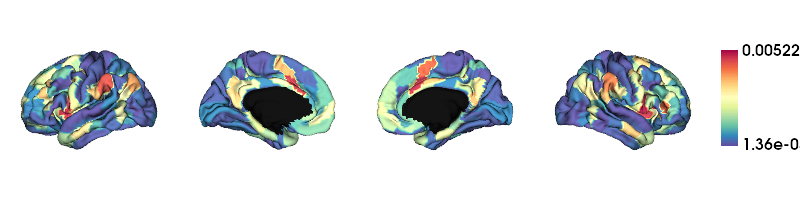

In [60]:
surf_lh, surf_rh = load_fsa5()
plot_hemispheres(surf_lh, surf_rh, array_name=[resid_sqsum_cortex], size=(800, 200), cmap=['Spectral_r'], color_bar=True, embed_nb=True)

In [64]:
min_max_scaler = preprocessing.MinMaxScaler()
resid_scaled_data = min_max_scaler.fit_transform(resid_sqsum_cortex.reshape(-1, 1))

/tmp/ipykernel_103997/1309353494.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


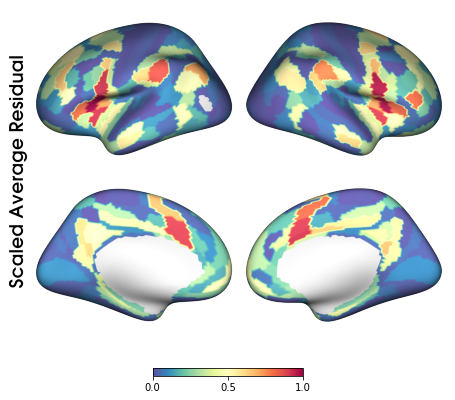

In [66]:
from surfplot import Plot
from neuromaps.datasets import fetch_fsaverage

surfaces = fetch_fsaverage(density='10k')
lh, rh = surfaces['inflated']

p = Plot(lh, rh, size=(800, 600), zoom=1.5, label_text={'left':['Scaled Average Residual']}, brightness=.8)
p.add_layer(resid_scaled_data, cmap='Spectral_r', cbar=True)
#p.add_layer(BF_scaled_data.reshape([20484]), cmap='binary', cbar=False)
fig = p.build()
fig.show()

#### weighted residuals

In [69]:
Func_var = pd.read_csv(Func_results + 'Func_HCPMMP_gradients_variance_gm-100.csv')
Diff_var = pd.read_csv(Diff_results + 'Diff_7Tsubj_gradients_variance_gm-100.csv') 
resid_squared = pd.read_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [70]:
func_var = Func_var.to_numpy()
diff_var = Diff_var.to_numpy()
np_resid_squared = resid_squared.to_numpy()

In [71]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4',
               's2-f1','s2-f2','s2-f3','s2-f4',
               's3-f1','s3-f2','s3-f3','s3-f4',
               's4-f1','s4-f2','s4-f3','s4-f4',
               's5-f1','s5-f2','s5-f3','s5-f4',
               's6-f1','s6-f2','s6-f3','s6-f4']

In [72]:
weight = np.zeros((6,4))
for s in range(6):
    for f in range(4):
        weight[s,f] = diff_var[s]+func_var[f]

In [73]:
weight = weight.reshape(24)
weighted_sqresid = pd.DataFrame(columns=combination)
for sf in range(24):
    ind = resid_squared.columns[sf]
    weighted_sqresid[combination[sf]] = resid_squared[ind]*weight[sf]

In [74]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.000038,1.176388e-06,6.870815e-09,3.667500e-08,0.000025,4.441971e-07,4.926066e-09,1.631204e-08,0.000044,8.534212e-07,...,2.750584e-09,2.976108e-09,0.000027,6.573481e-07,1.364919e-09,4.493720e-09,0.000040,7.664133e-08,5.032861e-09,1.423717e-10
1,0.000020,8.916609e-09,5.497549e-09,1.062539e-08,0.000020,5.752262e-09,2.649633e-09,8.134528e-09,0.000015,2.903730e-09,...,1.976034e-09,7.669893e-09,0.000008,4.914691e-09,2.082394e-09,4.432190e-09,0.000018,2.086171e-08,9.819641e-10,6.245967e-09
2,0.000015,1.116007e-08,7.134988e-10,6.608286e-09,0.000028,3.613747e-09,5.184247e-10,2.267111e-10,0.000016,6.453886e-10,...,3.106493e-10,1.111559e-10,0.000005,3.538596e-09,4.421026e-12,1.204748e-10,0.000028,3.696995e-08,6.494802e-10,3.736459e-10
3,0.000008,1.903566e-07,2.054597e-11,9.754826e-09,0.000008,4.964825e-08,2.095992e-11,2.853963e-09,0.000020,1.911680e-07,...,8.366676e-13,1.041014e-11,0.000004,1.106301e-07,1.295352e-10,5.193611e-10,0.000014,1.421585e-08,5.570296e-10,7.430222e-10
4,0.000006,2.802611e-07,5.629083e-13,4.478931e-09,0.000006,7.396890e-08,7.538356e-11,8.331187e-10,0.000012,2.404308e-07,...,2.150922e-12,5.392833e-10,0.000003,1.644980e-07,1.065042e-10,1.239194e-12,0.000015,1.328277e-09,4.744238e-10,1.839050e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,0.000274,1.100928e-07,1.616528e-07,1.005179e-08,0.000170,8.276984e-08,8.144212e-08,2.392350e-09,0.000157,4.069811e-08,...,5.945401e-08,5.204984e-10,0.000160,4.370262e-08,4.869873e-08,9.657819e-10,0.000123,1.794311e-07,3.651131e-08,7.141432e-12
356,0.000034,1.520053e-06,2.431243e-10,7.704732e-09,0.000023,8.592460e-07,5.141912e-11,3.078171e-09,0.000017,9.808587e-07,...,7.935872e-11,7.778146e-10,0.000020,7.711389e-07,1.542989e-10,1.019367e-09,0.000012,5.155049e-07,8.894841e-13,1.612258e-10
357,0.000162,5.428415e-07,4.326526e-08,9.134698e-10,0.000102,1.595300e-07,2.504380e-08,5.115088e-10,0.000119,3.664360e-07,...,1.625734e-08,4.027783e-10,0.000030,1.661455e-07,8.161198e-09,6.293292e-11,0.000120,1.171560e-07,1.385779e-08,8.924986e-10
358,0.000219,2.145570e-06,1.732050e-07,9.047132e-08,0.000179,1.949138e-06,8.396472e-08,4.452420e-08,0.000185,1.372485e-06,...,6.372479e-08,4.735286e-08,0.000076,8.517609e-07,4.794781e-08,3.531414e-08,0.000086,6.564769e-07,4.745605e-08,2.780599e-08


In [75]:
pd.DataFrame(weighted_sqresid).to_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv', index=False)

In [76]:
weighted_sqresid = pd.read_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [77]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.000038,1.176388e-06,6.870815e-09,3.667500e-08,0.000025,4.441971e-07,4.926066e-09,1.631204e-08,0.000044,8.534212e-07,...,2.750584e-09,2.976108e-09,0.000027,6.573481e-07,1.364919e-09,4.493720e-09,0.000040,7.664133e-08,5.032861e-09,1.423717e-10
1,0.000020,8.916609e-09,5.497549e-09,1.062539e-08,0.000020,5.752262e-09,2.649633e-09,8.134528e-09,0.000015,2.903730e-09,...,1.976034e-09,7.669893e-09,0.000008,4.914691e-09,2.082394e-09,4.432190e-09,0.000018,2.086171e-08,9.819641e-10,6.245967e-09
2,0.000015,1.116007e-08,7.134988e-10,6.608286e-09,0.000028,3.613747e-09,5.184247e-10,2.267111e-10,0.000016,6.453886e-10,...,3.106493e-10,1.111559e-10,0.000005,3.538596e-09,4.421026e-12,1.204748e-10,0.000028,3.696995e-08,6.494802e-10,3.736459e-10
3,0.000008,1.903566e-07,2.054597e-11,9.754826e-09,0.000008,4.964825e-08,2.095992e-11,2.853963e-09,0.000020,1.911680e-07,...,8.366676e-13,1.041014e-11,0.000004,1.106301e-07,1.295352e-10,5.193611e-10,0.000014,1.421585e-08,5.570296e-10,7.430222e-10
4,0.000006,2.802611e-07,5.629083e-13,4.478931e-09,0.000006,7.396890e-08,7.538356e-11,8.331187e-10,0.000012,2.404308e-07,...,2.150922e-12,5.392833e-10,0.000003,1.644980e-07,1.065042e-10,1.239194e-12,0.000015,1.328277e-09,4.744238e-10,1.839050e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,0.000274,1.100928e-07,1.616528e-07,1.005179e-08,0.000170,8.276984e-08,8.144212e-08,2.392350e-09,0.000157,4.069811e-08,...,5.945401e-08,5.204984e-10,0.000160,4.370262e-08,4.869873e-08,9.657819e-10,0.000123,1.794311e-07,3.651131e-08,7.141432e-12
356,0.000034,1.520053e-06,2.431243e-10,7.704732e-09,0.000023,8.592460e-07,5.141912e-11,3.078171e-09,0.000017,9.808587e-07,...,7.935872e-11,7.778146e-10,0.000020,7.711389e-07,1.542989e-10,1.019367e-09,0.000012,5.155049e-07,8.894841e-13,1.612258e-10
357,0.000162,5.428415e-07,4.326526e-08,9.134698e-10,0.000102,1.595300e-07,2.504380e-08,5.115088e-10,0.000119,3.664360e-07,...,1.625734e-08,4.027783e-10,0.000030,1.661455e-07,8.161198e-09,6.293292e-11,0.000120,1.171560e-07,1.385779e-08,8.924986e-10
358,0.000219,2.145570e-06,1.732050e-07,9.047132e-08,0.000179,1.949138e-06,8.396472e-08,4.452420e-08,0.000185,1.372485e-06,...,6.372479e-08,4.735286e-08,0.000076,8.517609e-07,4.794781e-08,3.531414e-08,0.000086,6.564769e-07,4.745605e-08,2.780599e-08


In [78]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1).to_numpy()
weighted_sumsq.shape

(360,)

In [79]:
weighted_sumsq_cortex = map_to_labels(weighted_sumsq, surf_labels, mask=mask, fill=np.nan)

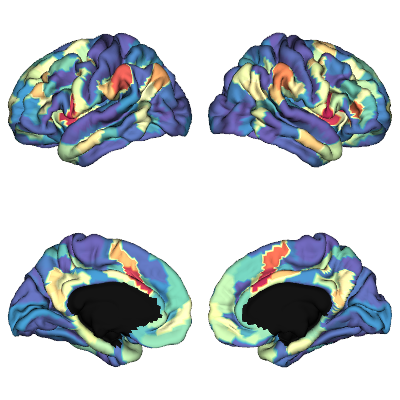

In [145]:
surf_lh, surf_rh = load_fsa5()
plot_hemispheres(surf_lh, surf_rh, array_name=[weighted_sumsq_cortex], zoom=1.2,
                 size=(400, 400), layout_style='grid', cmap=['Spectral_r','Spectral_r' ], 
                 color_bar=False, embed_nb=True)

In [82]:
min_max_scaler = preprocessing.MinMaxScaler()
weighted_resid_scaled_data = min_max_scaler.fit_transform(weighted_sumsq_cortex.reshape(-1, 1))

/tmp/ipykernel_103997/1483360979.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


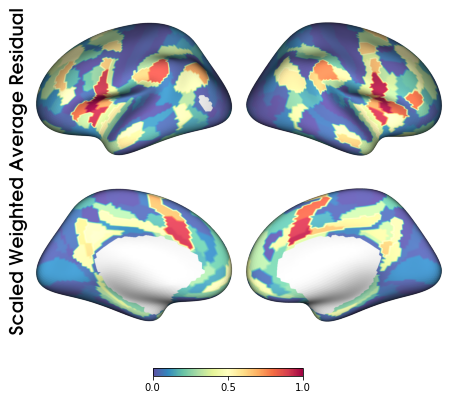

In [83]:
from surfplot import Plot
from neuromaps.datasets import fetch_fsaverage

surfaces = fetch_fsaverage(density='10k')
lh, rh = surfaces['inflated']

p = Plot(lh, rh, size=(800, 600), zoom=1.5, label_text={'left':['Scaled Weighted Average Residual']}, brightness=.8)
p.add_layer(weighted_resid_scaled_data.reshape([20484]), cmap='Spectral_r', cbar=True)
#p.add_layer(BF_scaled_data.reshape([20484]), cmap='binary', cbar=False)
fig = p.build()
fig.show()

#### network correspondence

In [86]:
labels_txt = pd.read_csv(data_path+'hcp_mmp10_yeo7_modes.txt',header=None)

In [87]:
labels_txt[['Label','Hemisphere','Area','ROI','Network#','Network']]= labels_txt[0].str.split('_',expand=True)
networks = labels_txt['Network'].unique()
num_network = labels_txt['Network#'].unique()

In [84]:
weighted_sqresid = pd.read_csv(results_path + 'Gradient-weighted-map_Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [85]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1)
weighted_sumsq.shape

(360,)

In [111]:
net_mean = []
weighted_sumsq_net = pd.DataFrame()
for nets in networks:
    net_df = labels_txt.loc[(labels_txt['Network'] == nets)]
    net_inds = list(net_df.index.values)
    net_con_df = weighted_sumsq.iloc[net_inds]
    net_mean = net_con_df.mean()
    weighted_sumsq_net[str(nets)] = pd.Series(net_mean)

In [112]:
weighted_sumsq_net.head(5)

,Visual,Somatomotor,Dorsal Attention,Ventral Attention,Default,Frontoparietal,Limbic
0,0.000141,0.000173,0.000474,0.001247,0.000508,0.000431,0.000335


In [113]:
wresid_melt = pd.melt(weighted_sumsq_net, var_name='Networks', value_name='Residuals')

In [114]:
wresid_melt

,Networks,Residuals
0,Visual,0.000141
1,Somatomotor,0.000173
2,Dorsal Attention,0.000474
3,Ventral Attention,0.001247
4,Default,0.000508
5,Frontoparietal,0.000431
6,Limbic,0.000335


/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trace_data = trace_data.append(trace_data.iloc[0])


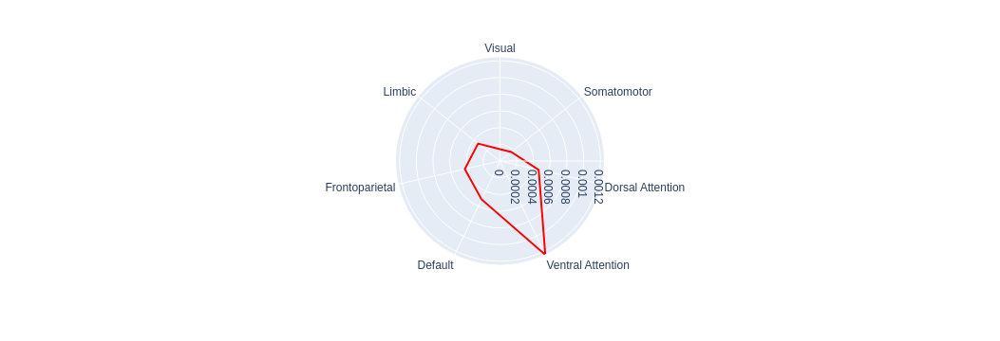

In [116]:
import plotly.express as px
# Checking individual cluster network
fig = px.line_polar(wresid_melt, r='Residuals', theta='Networks', color_discrete_sequence=['red'], line_close=True)
fig.show()

In [102]:
sort_weighted_sumsq_net = weighted_sumsq_net.mean().sort_values().index
sorted_weighted_sumsq_net = weighted_sumsq_net[sort_weighted_sumsq_net]
sorted_weighted_sumsq_net.head(5)

,Visual,Somatomotor,Limbic,Frontoparietal,Dorsal Attention,Default,Ventral Attention
0,0.000225,0.000029,0.000532,0.000117,0.001291,0.000098,0.000067
1,0.000101,0.000057,0.000103,0.000146,0.001385,0.000090,0.000169
2,0.000122,0.000255,0.000289,0.000082,0.000022,0.001318,0.000236
3,0.000072,0.000038,0.000053,0.000500,0.000243,0.001182,0.000655
4,0.000061,0.000010,0.000274,0.000016,0.000384,0.000217,0.001186


In [103]:
sorted_wresid_melt_net = pd.melt(sorted_weighted_sumsq_net, var_name='Networks', value_name='Residuals')
sorted_wresid_melt_net.head(5)

,Networks,Residuals
0,Visual,0.000225
1,Visual,0.000101
2,Visual,0.000122
3,Visual,0.000072
4,Visual,0.000061


In [97]:
from matplotlib.colors import ListedColormap
from brainstat.datasets import fetch_mask, fetch_template_surface
from brainstat.datasets import fetch_parcellation
from brainspace.plotting.surface_plotting import plot_hemispheres
from brainstat.datasets import fetch_yeo_networks_metadata

surfaces = fetch_template_surface("fsaverage5", join=False)
yeo_networks = fetch_parcellation("fsaverage5", "yeo", 7)
network_names, yeo_colormap = fetch_yeo_networks_metadata(7)
yeo_colormap_gray = np.concatenate((np.array([[0.7, 0.7, 0.7]]), yeo_colormap))
yeoCols = ListedColormap(yeo_colormap_gray, name='yeo_colormap')

In [99]:
yeo_cols = {"Visual":yeoCols.colors[1,:], "Somatomotor":yeoCols.colors[2,:], "Dorsal Attention":yeoCols.colors[3,:], "Ventral Attention":yeoCols.colors[4,:], "Default":yeoCols.colors[5,:], "Frontoparietal":yeoCols.colors[6,:], "Limbic":yeoCols.colors[7,:]}

[Text(4.969119644685597e-06, 0, 'Min'), Text(0.0021683934510904456, 0, 'Max')]

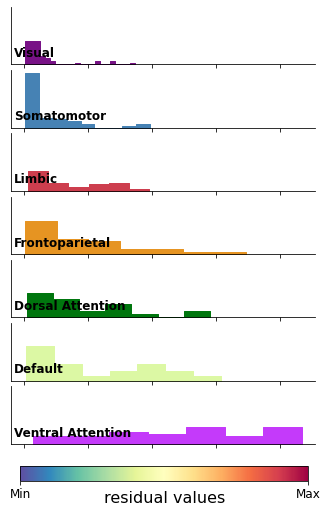

In [122]:
g = sns.FacetGrid(sorted_wresid_melt_net, row="Networks", hue="Networks", aspect=5, height=1, palette=yeo_cols)
g.map(sns.histplot,"Residuals", element="step", fill=True, alpha=1, common_bins=True)
#g.set(ylim=(0, 25))

def label(x, color, label):
    ax = plt.gca()
    ax.text(0.01, .2, label, fontweight="bold",
            ha="left", va="center", fontsize=12, transform=ax.transAxes)
g.map(label, "Residuals")

g.set_titles("")
g.set(yticklabels=[], yticks=[], ylabel="", xlabel="", xticklabels=[])
g.figure.subplots_adjust(hspace=0.1)

norm = matplotlib.colors.Normalize(vmin=weighted_sumsq.min(), vmax=weighted_sumsq.max())
cb_ax = g.fig.add_axes([0.15, 0.01, 0.8, 0.03]) # start x, start y, length x, height y
cb = g.fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r),
                    ticks=[weighted_sumsq.min(), weighted_sumsq.max()],
                    cax=cb_ax, orientation='horizontal')
cb.set_label('residual values', fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

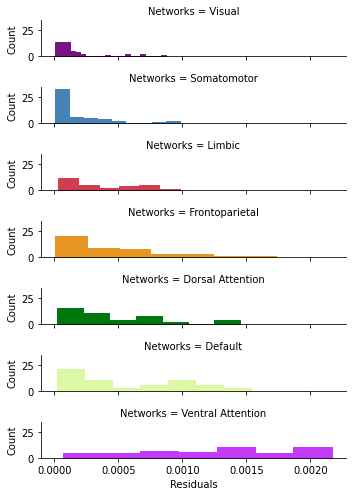

In [117]:
g = sns.FacetGrid(sorted_wresid_melt_net, row="Networks", hue="Networks", aspect=5, height=1, palette=yeo_cols)
g.map(sns.histplot,"Residuals", element="step", fill=True, alpha=1, common_bins=True)

### (OLD) getting the residuals of significant combinations

In [58]:
criteria = pval_matrix < pval

In [59]:
pval_col = criteria.reshape([25])

In [60]:
resid_sig = resid_results.loc[:, pval_col]

In [62]:
pd.DataFrame(resid_sig).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv', index=False)

In [65]:
resid_sig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv')
resid_sig

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,-0.057653,-0.055553,0.001975,-0.016816,0.024720,-0.031991,0.035652,-0.081865,-0.015119
1,-0.042537,-0.059177,0.004201,0.000010,0.018551,0.056339,0.049758,-0.092591,-0.014990
2,-0.017267,-0.059772,-0.004495,0.011007,0.043890,0.076051,0.073558,-0.094597,-0.023413
3,-0.057767,-0.055482,0.001809,-0.016923,-0.016341,0.102488,0.025057,-0.092442,-0.019380
4,-0.045108,-0.068165,-0.003121,-0.015820,0.022789,-0.018816,0.043685,-0.088267,-0.017038
...,...,...,...,...,...,...,...,...,...
594,0.250117,0.118244,0.012219,-0.031093,0.206290,0.171875,0.205273,0.104133,0.019214
595,0.246290,0.130194,0.017884,-0.029380,0.232257,0.156189,0.148055,0.057641,0.016179
596,0.232110,0.136999,0.017400,-0.025150,0.209124,0.169937,0.158295,0.062827,0.018055
597,0.244702,0.140372,0.020918,-0.026297,0.256860,0.145182,0.107910,0.018031,0.012501


#### squared sum significnat residuals (and average)

In [79]:
resid_sig_squared = resid_sig**2
resid_sig_squared

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.001023,0.001271,0.006702,0.000229
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.003174,0.002476,0.008573,0.000225
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.005784,0.005411,0.008949,0.000548
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.010504,0.000628,0.008546,0.000376
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.000354,0.001908,0.007791,0.000290
...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.029541,0.042137,0.010844,0.000369
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.024395,0.021920,0.003322,0.000262
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.028879,0.025057,0.003947,0.000326
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.021078,0.011645,0.000325,0.000156


In [80]:
resid_sig_sqsum = resid_sig_squared.sum(axis=1)

In [81]:
resid_sig_sqsum_np = resid_sig_sqsum.to_numpy()

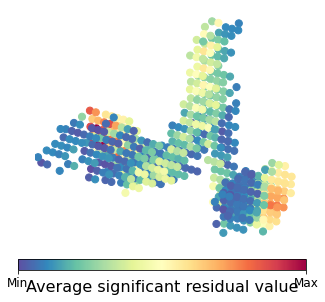

In [82]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_sig_sqsum
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=resid_sig_sqsum_np.min(), vmax=resid_sig_sqsum_np.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[resid_sig_sqsum_np.min(), resid_sig_sqsum_np.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average significant residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_significant-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [83]:
np_resid_sig_squared = resid_sig_squared.to_numpy()

In [88]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4','s2-f1','s3-f1','s4-f1','s4-f2','s5-f3']

In [87]:
np_resid_sig_squared[:,0].shape

(599,)

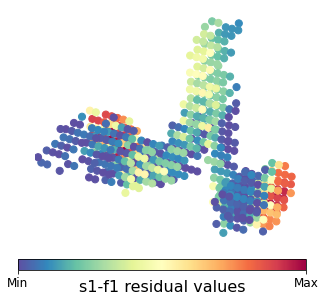

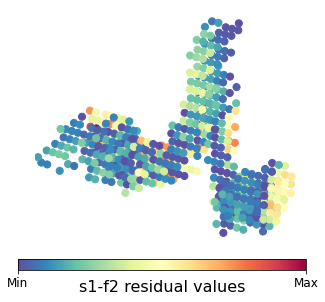

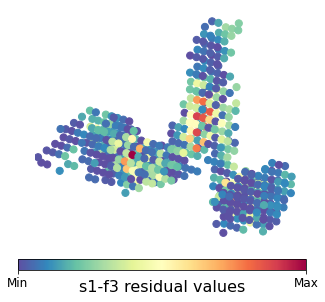

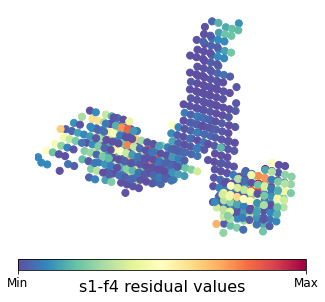

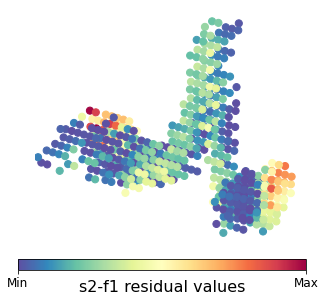

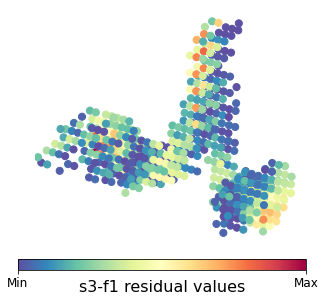

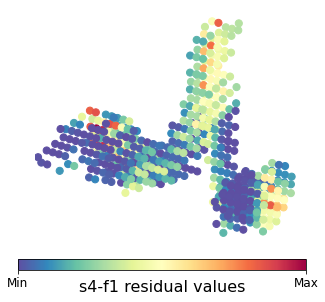

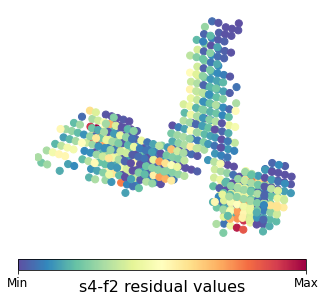

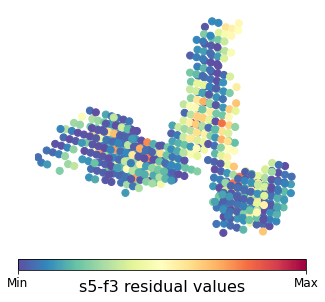

In [91]:
for res in range(9):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_sig_squared[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_sig_squared[:,res].min(), vmax=np_resid_sig_squared[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_sig_squared[:,res].min(), np_resid_sig_squared[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

#### Variance weighted squared sum significnat residuals (and average)

In [93]:
Func_var = pd.read_csv(Func_results + 'Func_HCPMMP_gradients_variance_gm-10.csv')
Diff_var = pd.read_csv(Diff_results + 'Diff_7Tsubj_gradients_variance_gm-10.csv')          

In [94]:
func_var = Func_var.to_numpy()
diff_var = Diff_var.to_numpy()

In [95]:
resid_sig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv')
resid_square_results = resid_sig**2

In [96]:
resid_square_results

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.001023,0.001271,0.006702,0.000229
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.003174,0.002476,0.008573,0.000225
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.005784,0.005411,0.008949,0.000548
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.010504,0.000628,0.008546,0.000376
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.000354,0.001908,0.007791,0.000290
...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.029541,0.042137,0.010844,0.000369
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.024395,0.021920,0.003322,0.000262
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.028879,0.025057,0.003947,0.000326
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.021078,0.011645,0.000325,0.000156


In [97]:
resid_square_results['(0, 0)'] = resid_square_results['(0, 0)']*(diff_var[0]+func_var[0])
resid_square_results['(0, 1)'] = resid_square_results['(0, 1)']*(diff_var[0]+func_var[1])
resid_square_results['(0, 2)'] = resid_square_results['(0, 2)']*(diff_var[0]+func_var[2])
resid_square_results['(0, 3)'] = resid_square_results['(0, 3)']*(diff_var[0]+func_var[3])
resid_square_results['(1, 0)'] = resid_square_results['(1, 0)']*(diff_var[1]+func_var[0])
resid_square_results['(2, 0)'] = resid_square_results['(2, 0)']*(diff_var[2]+func_var[0])
resid_square_results['(3, 0)'] = resid_square_results['(3, 0)']*(diff_var[3]+func_var[0])
resid_square_results['(3, 1)'] = resid_square_results['(3, 1)']*(diff_var[3]+func_var[1])
resid_square_results['(4, 2)'] = resid_square_results['(4, 2)']*(diff_var[4]+func_var[2])

In [99]:
pd.DataFrame(resid_square_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_sum-variance-gm10-wighted-significant-residuals_statsmodels.csv', index=False)

In [100]:
resid_wsig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_sum-variance-gm10-wighted-significant-residuals_statsmodels.csv')

In [101]:
resid_wsig

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.002694,0.002040,0.000002,1.286166e-04,0.000362,0.000569,0.000669,0.002526,0.000031
1,0.001466,0.002315,0.000008,4.849338e-11,0.000204,0.001765,0.001303,0.003232,0.000031
2,0.000242,0.002361,0.000009,5.510600e-05,0.001141,0.003217,0.002849,0.003373,0.000074
3,0.002704,0.002035,0.000001,1.302675e-04,0.000158,0.005842,0.000331,0.003221,0.000051
4,0.001649,0.003071,0.000004,1.138350e-04,0.000308,0.000197,0.001005,0.002937,0.000039
...,...,...,...,...,...,...,...,...,...
594,0.050700,0.009241,0.000068,4.397347e-04,0.025198,0.016431,0.022184,0.004088,0.000050
595,0.049160,0.011203,0.000147,3.926202e-04,0.031941,0.013568,0.011541,0.001252,0.000036
596,0.043662,0.012405,0.000139,2.877011e-04,0.025895,0.016062,0.013192,0.001488,0.000044
597,0.048528,0.013023,0.000201,3.145477e-04,0.039066,0.011723,0.006131,0.000123,0.000021


In [102]:
resid_wsig_sum = resid_wsig.sum(axis=1)

In [104]:
np_resid_wsig_sum = resid_wsig_sum.to_numpy()

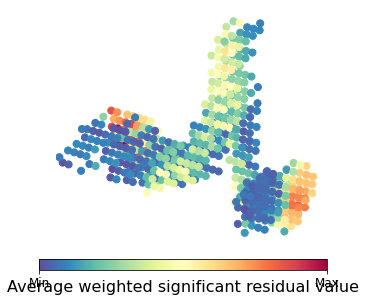

In [105]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_wsig_sum
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=np_resid_wsig_sum.min(), vmax=np_resid_wsig_sum.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[np_resid_wsig_sum.min(), np_resid_wsig_sum.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average weighted significant residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_significant-weighted-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [106]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4','s2-f1','s3-f1','s4-f1','s4-f2','s5-f3']

In [107]:
np_resid_wsig = resid_wsig.to_numpy()

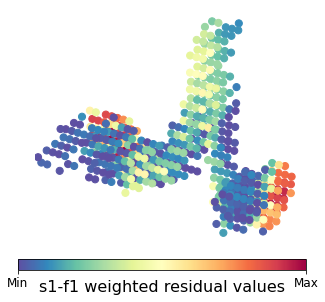

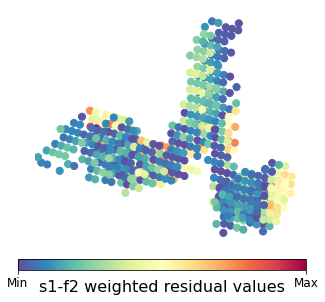

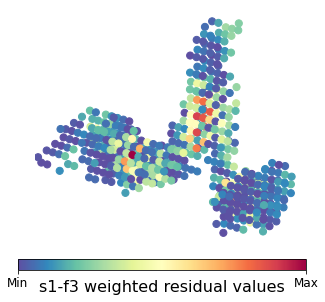

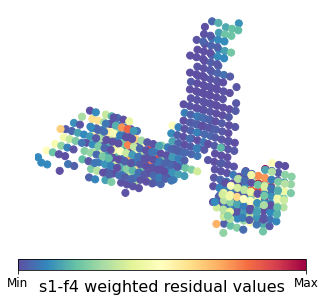

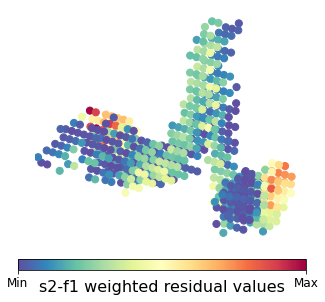

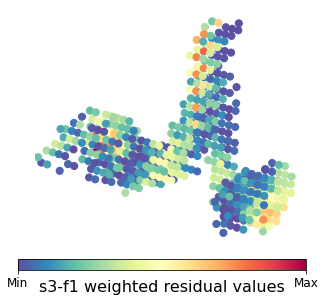

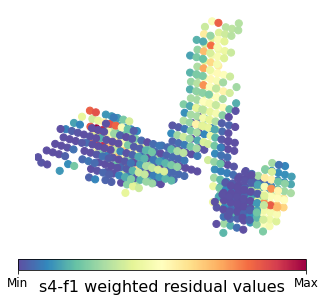

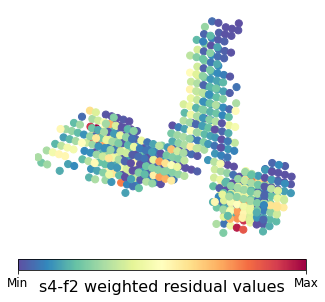

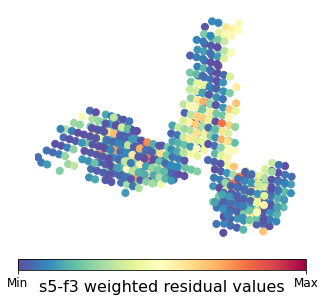

In [108]:
for res in range(9):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_wsig[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_wsig[:,res].min(), vmax=np_resid_wsig[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_wsig[:,res].min(), np_resid_wsig[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' weighted residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_weighted-residuals.png', dpi=300, bbox_inches='tight')
    plt.show()